# Tutorial for Runnning the algorithm with 2D and 3D structural point cloud data as the input file.
## Step 1: The first step involves loading all essential packages, initializing the setup, and defining the core components required to run the algorithm's code.

In [1]:
import pandas as pd
import numpy as np
import ripser
import matplotlib.pyplot as plt
import umap
import math
import networkx as nx
import gudhi as gd
from gtda.mapper import CubicalCover, make_mapper_pipeline, Projection, plot_static_mapper_graph
from sklearn.cluster import DBSCAN
from scipy.spatial.distance import pdist, squareform
from scipy.sparse.csgraph import connected_components
from matplotlib.cm import get_cmap
# Data viz
from gtda.plotting import plot_point_cloud
import matplotlib.patches as mpatches
np.random.seed(42)

def calculate_diameter(xyz_points):
    """Calculate the diameter of a 3D dataset (the largest distance between any two points)."""
    distances = pdist(xyz_points)
    max_distance = np.max(distances)
    L = round(max_distance)
    return L

def calculate_partitions(L, epsilon, alpha):
    """Calculate the number of partitions (N) for a given set length (L), partition length (epsilon), and overlap percentage (alpha)."""
    shift = epsilon * (1 - alpha / 100)
    N = math.floor((L - epsilon) / shift) + 1
    return N

def find_connected_components(data, R):
    """
    Finds connected components in the Vietoris-Rips complex.
    """
    from scipy.sparse.csgraph import connected_components
    from scipy.spatial.distance import pdist, squareform

    # Compute pairwise distances
    dist_matrix = squareform(pdist(data))

    # Create adjacency matrix
    adjacency_matrix = (dist_matrix <= R).astype(int)

    # Find connected components
    n_components, labels = connected_components(adjacency_matrix, directed=False)
    components = [data[labels == i] for i in range(n_components)]

    return components

# Define the functions (unchanged)
def plot_vietoris_rips_complex(data, R, label="data", col=1, maxdim=2):
    """
    Plots the Vietoris-Rips complex for a given set of points.
    """
    tab10 = plt.get_cmap('tab10')  # Colormap for points
    viridis = plt.get_cmap('viridis')  # Colormap for triangles

    # Create figure with specified size and DPI
    fig, ax = plt.subplots(figsize=(6, 5), dpi=150)
    
    # Enhanced title and labels with bold fonts
    ax.set_title(
        f"Vietoris-Rips Complex (R = {R})", 
        fontsize=18, 
        fontweight='bold', 
        pad=20
    )
    ax.set_xlabel("X Coordinate", fontsize=14, fontweight='bold', labelpad=10)
    ax.set_ylabel("Y Coordinate", fontsize=14, fontweight='bold', labelpad=10)

    # Plot points with adjusted size
    ax.scatter(
        data[:, 0], data[:, 1], label=label,
        s=40, alpha=0.9, c=np.array([tab10(col)] * len(data)),  # Larger dots
        edgecolors='black', linewidths=0.5  # Add black borders for better visibility
    )

    # Step 1: Add lighter circles for each point
    for xy in data:
        ax.add_patch(mpatches.Circle(
            xy, radius=R, fill=False,
            edgecolor=tab10(col), alpha=0.15, linestyle='dashed', linewidth=0.8
        ))

    # Step 2: Draw edges (1-simplices) with better visibility
    for i, xy in enumerate(data):
        for j in range(i + 1, len(data)):
            pq = data[j]
            if np.linalg.norm(xy - pq) <= R:
                ax.plot(
                    [xy[0], pq[0]], [xy[1], pq[1]],
                    color=tab10(col), alpha=0.8, linewidth=1.2
                )

    # Step 3: Draw triangles (2-simplices) if maxdim >= 2
    if maxdim >= 2:
        triangle_index = 0
        for i, xy in enumerate(data):
            for j in range(i + 1, len(data)):
                pq = data[j]
                if np.linalg.norm(xy - pq) <= R:
                    for k in range(j + 1, len(data)):
                        ab = data[k]
                        if (np.linalg.norm(xy - ab) <= R and \
                           np.linalg.norm(pq - ab) <= R):
                            triangle = np.array([xy, pq, ab])
                            color = viridis(triangle_index / len(data))
                            ax.fill(
                                triangle[:, 0], triangle[:, 1],
                                color=color, alpha=0.5, edgecolor='black', linewidth=0.3
                            )
                            triangle_index += 1

    # Additional styling
    ax.axis('equal')
    ax.grid(True, linestyle=':', alpha=0.3)
    ax.tick_params(axis='both', which='major', labelsize=18)
    
    # Remove top and right spines
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Adjust legend if needed
    if label:
        ax.legend(fontsize=20, framealpha=0.9)
    
    plt.tight_layout()
    
    # Save with high quality
    plt.savefig(
        f'vietoris_rips_R{R}.png',
        dpi=300,
        bbox_inches='tight',
        facecolor=fig.get_facecolor(),
        transparent=False
    )
    
    plt.show()

    # Find and return connected components
    components = find_connected_components(data, R)
    return components

def calculate_epsilon_for_betti_value_gd(persistence, resolution=1000):
    """
    Calculate the epsilon (threshold) at which Betti-1 reaches its maximum value.
    """
    x_values, betti_0, betti_1 = calculate_betti_curves_gd(persistence, resolution=resolution)
   
    # Find the index where Betti-1 is maximum using NumPy
    max_betti_1_index = np.argmax(betti_1)
   
    # Get the corresponding epsilon value
    epsilon_at_max_betti_1 = x_values[max_betti_1_index]
   
    return epsilon_at_max_betti_1, betti_1[max_betti_1_index]

def calculate_betti_curves(persistence_diagrams, resolution=1000):
    """
    Calculate Betti curves from a persistence diagram returned by ripser.

    Parameters:
        persistence_diagrams (list of arrays): Persistence diagrams from ripser.
        resolution (int): Number of points to evaluate the Betti curves.

    Returns:
        x_values (array): Threshold values.
        betti_0 (array): Betti-0 curve.
        betti_1 (array): Betti-1 curve.
    """
    # Extract H0 and H1 persistence diagrams
    dim_0_points = persistence_diagrams[0]  # H0 (connected components)
    dim_1_points = persistence_diagrams[1]  # H1 (loops)

    # Remove infinite death values for H0
    dim_0_points = dim_0_points[~np.isinf(dim_0_points[:, 1])]

    # Combine all finite values to determine the range for the x-axis
    all_finite_values = np.concatenate([dim_0_points.flatten(), dim_1_points.flatten()])
    all_finite_values = all_finite_values[~np.isinf(all_finite_values)]  # Remove infinities
    min_val = np.min(all_finite_values)
    max_val = np.max(all_finite_values)

    # Create x-values for the Betti curves
    x_values = np.linspace(min_val, max_val, resolution)

    # Initialize Betti curves
    betti_0 = np.zeros(resolution)
    betti_1 = np.zeros(resolution)

    # Compute Betti-0 curve (connected components)
    for i, x in enumerate(x_values):
        betti_0[i] = np.sum((dim_0_points[:, 0] <= x) & (x <= dim_0_points[:, 1]))

    # Compute Betti-1 curve (loops)
    for i, x in enumerate(x_values):
        betti_1[i] = np.sum((dim_1_points[:, 0] <= x) & (x <= dim_1_points[:, 1]))

    return x_values, betti_0, betti_1

def calculate_betti_curves_gd(persistence, resolution=1000):
    """
    Calculate Betti curves from a persistence diagram.
    """
    dim_0_points = [(b, d) for dim, (b, d) in persistence if dim == 0]
    dim_1_points = [(b, d) for dim, (b, d) in persistence if dim == 1]
   
    dim_0_points = [(b, d) for b, d in dim_0_points if not np.isinf(d)]
   
    all_finite_values = [x for pair in dim_0_points + dim_1_points for x in pair]
    min_val = min(all_finite_values)
    max_val = max(all_finite_values)
   
    x_values = np.linspace(min_val, max_val, resolution)
    betti_0 = np.zeros(resolution)
    betti_1 = np.zeros(resolution)
   
    for i, x in enumerate(x_values):
        betti_0[i] = sum(1 for b, d in dim_0_points if b <= x and x <= d)
        betti_1[i] = sum(1 for b, d in dim_1_points if b <= x and x <= d)
   
    return x_values, betti_0, betti_1

def calculate_all_betti_ranges(persistence_diagrams, resolution=1000):
    """Calculate the ranges of epsilon values for all Betti-1 values."""
    x_values, betti_0, betti_1 = calculate_betti_curves(persistence_diagrams, resolution=resolution)

    # Find all unique Betti-1 values in descending order
    unique_betti_values = np.unique(betti_1)[::-1]

    # Dictionary to store ranges for each Betti-1 value
    betti_ranges = {}

    for betti_value in unique_betti_values:
        if betti_value == 0:
            continue  # Skip Betti-0

        # Find all indices where Betti-1 equals the current value
        betti_indices = np.where(betti_1 == betti_value)[0]

        if len(betti_indices) == 0:
            continue

        # Group consecutive indices to find continuous ranges
        ranges = []
        start = betti_indices[0]
        for i in range(1, len(betti_indices)):
            if betti_indices[i] != betti_indices[i - 1] + 1:
                ranges.append((x_values[start], x_values[betti_indices[i - 1]]))
                start = betti_indices[i]
        ranges.append((x_values[start], x_values[betti_indices[-1]]))

        betti_ranges[betti_value] = ranges

    return betti_ranges

def calculate_total_ranges(betti_ranges):
    """Calculate the total range for each Betti number, with a 20% multiplier for betti_1."""
    total_ranges = {}
    for betti_value, ranges in betti_ranges.items():
        if betti_value == 1:
            # Multiply the range by 20% for betti_1
            total_range = sum((end - start) * 0.2 for start, end in ranges)
        else:
            total_range = sum(end - start for start, end in ranges)
        total_ranges[betti_value] = total_range
    return total_ranges

def find_max_betti(total_ranges):
    """Find the Betti number with the highest total range."""
    max_betti = max(total_ranges, key=total_ranges.get)
    max_range = total_ranges[max_betti]
    return max_betti, max_range

def calculate_mean_range_for_max_betti(betti_ranges, max_betti):
    """Calculate the mean of the lowest and highest range values for the Betti number with the highest total range."""
    ranges = betti_ranges[max_betti]
    lowest_value = min(start for start, end in ranges)
    highest_value = max(end for start, end in ranges)
    mean_range = (lowest_value + highest_value) / 2
    return mean_range

def plot_betti_curve_with_cutoffs(x_values, betti_1, betti_ranges):
    """Plot the Betti-1 curve with cutoff points marked."""
    plt.figure(figsize=(10, 6))
    plt.plot(x_values, betti_1, label="Betti-1 Curve", color="blue")

    # Mark cutoff points for each Betti-1 value
    for betti_value, ranges in betti_ranges.items():
        for r in ranges:
            plt.axvline(x=r[0], color="red", linestyle="--", alpha=0.5, label=f"Cutoff for Betti-1={betti_value}" if r == ranges[0] else "")
            plt.axvline(x=r[1], color="green", linestyle="--", alpha=0.5, label=f"End for Betti-1={betti_value}" if r == ranges[0] else "")

    plt.xlabel("Epsilon")
    plt.ylabel("Betti-1 Value")
    plt.title("Betti-1 Curve with Cutoff Points")
    plt.legend()
    plt.grid()
    plt.show()

def plot_betti_curves_gd(persistence):
    """
    Plot Betti curves.
    """
    x_vals, b0_curve, b1_curve = calculate_betti_curves_gd(persistence)
   
    plt.figure(figsize=(10, 6))
    plt.plot(x_vals, b0_curve, 'b-', label='β₀ (Components)')
    plt.plot(x_vals, b1_curve, 'r-', label='β₁ (Loops)')
    plt.xlabel('Threshold')
    plt.ylabel('Betti Number')
    plt.title('Betti Curves')
    plt.legend()
    plt.grid(True)
    plt.show()    
   
def plot_betti_curves(persistence_diagrams):
    """
    Plot Betti curves.

    Parameters:
        persistence_diagrams (list of arrays): Persistence diagrams from ripser.
    """
    x_vals, b0_curve, b1_curve = calculate_betti_curves(persistence_diagrams)

    plt.figure(figsize=(10, 6))
    plt.plot(x_vals, b0_curve, 'b-', label='β₀ (Components)')
    plt.plot(x_vals, b1_curve, 'r-', label='β₁ (Loops)')
    plt.xlabel('Threshold')
    plt.ylabel('Betti Number')
    plt.title('Betti Curves')
    plt.legend()
    plt.grid(True)
    plt.show()

def process_structural_data(xyz_points, k, cutoff_betti):


    # Compute persistent homology
    result = ripser.ripser(xyz_points, do_cocycles=False)
    persistence_diagrams = result['dgms']

    # Plot persistence diagram
    for i, diagram in enumerate(persistence_diagrams):
        plt.scatter(diagram[:, 0], diagram[:, 1], label=f'H{i}', alpha=0.5)
    plt.title("Persistence Diagram")
    plt.xlabel("Birth")
    plt.ylabel("Death")
    plt.legend()
    plt.grid()
    plt.show()

    # Calculate Betti curves
    x_values, betti_0, betti_1 = calculate_betti_curves(persistence_diagrams)

    # Plot Betti curves
    plot_betti_curves(persistence_diagrams)

    # Calculate Betti ranges
    betti_ranges = calculate_all_betti_ranges(persistence_diagrams)

    # Print Betti ranges
    for betti_value, ranges in sorted(betti_ranges.items(), reverse=True):
        for r in ranges:
            print(f"The Betti-1 value {betti_value} has a range [{r[0]:.4f}, {r[1]:.4f}]")

    # Plot Betti-1 curve with cutoff points
    plot_betti_curve_with_cutoffs(x_values, betti_1, betti_ranges)

    # Calculate total ranges for each Betti number
    total_ranges = calculate_total_ranges(betti_ranges)

    # Find the Betti number with the highest total range
    max_betti, max_range = find_max_betti(total_ranges)

    # Print total ranges for each Betti number
    for betti_value, total_range in sorted(total_ranges.items(), reverse=True):
        print(f"Betti-1 value {betti_value} has a total range of {total_range:.4f}")

    # Print the Betti number with the highest total range
    print(f"\nThe Betti-1 value with the highest total range is {max_betti} with a total range of {max_range:.4f}")

    # Calculate epsilon_1 and Betti_1_1
    epsilon_1 = calculate_mean_range_for_max_betti(betti_ranges, max_betti)
    Betti_1_1 = max_betti

    # Print results
    print(f"The mean range for the Betti number with the highest total range is: {epsilon_1:.4f}")
    print(f"The corresponding Betti number is: {Betti_1_1}")


    plot_point_cloud(xyz_points)
    L = calculate_diameter(xyz_points)
    print(f"The diameter of the dataset (rounded to the nearest integer) is: {L}")
    alpha_values = [10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
    results = []
    for alpha in alpha_values:
        N = calculate_partitions(L, epsilon_1, alpha)
        print(f"For alpha = {alpha}%, N = {N}")
        filter_func = Projection(columns=[0, 1])
        cover = CubicalCover(n_intervals=N, overlap_frac=alpha / 100)
        clusterer = DBSCAN()
        n_jobs = 1
        pipe = make_mapper_pipeline(filter_func=filter_func, cover=cover, clusterer=clusterer, verbose=False, n_jobs=n_jobs)
        fig = plot_static_mapper_graph(pipe, xyz_points)
        fig.show(config={'scrollZoom': True})
        graph = pipe.fit_transform(xyz_points)
        adjacency_matrix = graph.get_adjacency()
        adjacency_matrix = np.array(adjacency_matrix.data)
        print("\nAdjacency Matrix:")
        print(adjacency_matrix)
        graph = nx.from_numpy_array(adjacency_matrix)
        #graph = nx.from_numpy_matrix(adjacency_matrix)
        pos = nx.spring_layout(graph, k=0.4, iterations=100, scale=L, seed=42)
        coords = np.array(list(pos.values()))
        plt.figure(figsize=(6, 5), dpi=300)  # Larger figure size and high DPI

        # Create the scatter plot with custom styling
        scatter = plt.scatter(coords[:, 0], coords[:, 1], 
                             c='steelblue',      # Custom color
                             s=100,              # Larger point size
                             alpha=0.7,          # Slight transparency
                             edgecolor='white',   # White edges for better visibility
                             linewidth=0.5)       # Edge thickness

        # Add title and labels with custom styling
        plt.title('Force-directed Layout', 
                  fontsize=26, pad=20, 
                  fontweight='bold')
        plt.xlabel('X Coordinate', fontsize=22, labelpad=10)
        plt.ylabel('Y Coordinate', fontsize=22, labelpad=10)

        # Adjust grid and background for better readability
        plt.grid(True, linestyle='--', alpha=0.3)
        plt.gca().set_facecolor('#f5f5f5')  # Light gray background

        # Equal aspect ratio to prevent distortion
        plt.gca().set_aspect('equal', adjustable='datalim')

        # Remove top and right spines for cleaner look
        plt.gca().spines['top'].set_visible(False)
        plt.gca().spines['right'].set_visible(False)

        # Add a legend if needed (customize if you have specific categories)
        # plt.legend(title='Categories', bbox_to_anchor=(1.05, 1), loc='upper left')

        # Tight layout to prevent label cutoff
        plt.tight_layout()

        # Save as high-quality PNG
        plt.savefig('force_directed_layout.png', 
                    dpi=100, 
                    bbox_inches='tight', 
                    transparent=False,
                    quality=100)

        plt.show()
        rips_complex = gd.RipsComplex(points=coords)
        simplex_tree = rips_complex.create_simplex_tree(max_dimension=2)
        persistence = simplex_tree.persistence()
        persistence = [(dim, (birth, death)) for dim, (birth, death) in persistence if dim != 1 or (death - birth) > 0.04]
        gd.plot_persistence_diagram(persistence)
        plt.title("Persistence Diagram")
        plt.show()
        plot_betti_curves_gd(persistence)
        epsilon_2, max_betti_1 = calculate_epsilon_for_betti_value_gd(persistence)
        if epsilon_2 is not None:
            print(f"The epsilon (threshold) at which Betti-1 reaches its maximum value of {max_betti_1} is approximately {epsilon_2:.4f}")
        else:
            print("The target Betti-1 value was not reached within the calculated range.")
        Betti_1_2 = max_betti_1
        modulus_Betti = abs(Betti_1_1 - Betti_1_2)
        if modulus_Betti <= cutoff_betti:
            print("Betti condition is satisfied.")
            connected_components = plot_vietoris_rips_complex(coords, R=epsilon_2, label=None, maxdim=2)
            print("Connected Components:", connected_components)
            results.append({
                "%overlap": alpha,
                "N value": N,
                "Betti_1_1": Betti_1_1,
                "Betti_1_2": Betti_1_2,
                "epsilon_1": epsilon_1,
                "epsilon_2": epsilon_2
            })
        else:
            print("Betti condition is not satisfied.")
    df = pd.DataFrame(results)
    print("\nResults DataFrame:")
    print(df)
    return df

def most_persistenet_structural(xyz_points):


    # Compute persistent homology
    result = ripser.ripser(xyz_points, do_cocycles=False)
    persistence_diagrams = result['dgms']

    # Plot persistence diagram
    for i, diagram in enumerate(persistence_diagrams):
        plt.scatter(diagram[:, 0], diagram[:, 1], label=f'H{i}', alpha=0.5)
    plt.title("Persistence Diagram")
    plt.xlabel("Birth")
    plt.ylabel("Death")
    plt.legend()
    plt.grid()
    plt.show()

    # Calculate Betti curves
    x_values, betti_0, betti_1 = calculate_betti_curves(persistence_diagrams)

    # Plot Betti curves
    plot_betti_curves(persistence_diagrams)

    # Calculate Betti ranges
    betti_ranges = calculate_all_betti_ranges(persistence_diagrams)

    # Print Betti ranges
    for betti_value, ranges in sorted(betti_ranges.items(), reverse=True):
        for r in ranges:
            print(f"The Betti-1 value {betti_value} has a range [{r[0]:.4f}, {r[1]:.4f}]")

    # Plot Betti-1 curve with cutoff points
    plot_betti_curve_with_cutoffs(x_values, betti_1, betti_ranges)

    # Calculate total ranges for each Betti number
    total_ranges = calculate_total_ranges(betti_ranges)

    # Find the Betti number with the highest total range
    max_betti, max_range = find_max_betti(total_ranges)

    # Print total ranges for each Betti number
    for betti_value, total_range in sorted(total_ranges.items(), reverse=True):
        print(f"Betti-1 value {betti_value} has a total range of {total_range:.4f}")

    # Print the Betti number with the highest total range
    print(f"\nThe Betti-1 value with the highest total range is {max_betti} with a total range of {max_range:.4f}")

    # Calculate epsilon_1 and Betti_1_1
    epsilon_1 = calculate_mean_range_for_max_betti(betti_ranges, max_betti)
    Betti_1_1 = max_betti

    # Print results
    print(f"The mean range for the Betti number with the highest total range is: {epsilon_1:.4f}")
    print(f"The corresponding Betti number is: {Betti_1_1}")

### Step 2: We here do get the random torus or the structural scatter point at random for our data, but here in this stem we need to import or get a 2D or 3D point cloud data to be used in the algorithm.

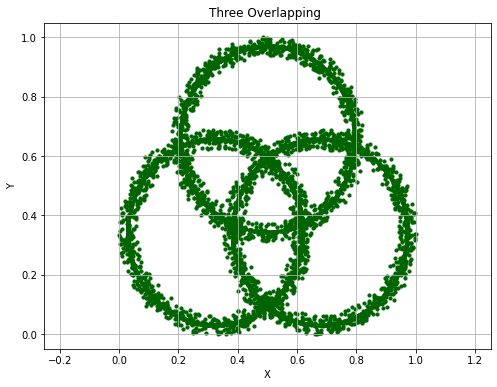

In [2]:
import numpy as np
import matplotlib.pyplot as plt

# Generate random points on a circle
def generate_circle_points(center, radius, n_points):
    angles = np.random.uniform(0, 2 * np.pi, n_points)
    x = center[0] + radius * np.cos(angles)
    y = center[1] + radius * np.sin(angles)
    return np.column_stack((x, y))

# Parameters
n_points_per_circle = 2000
radius = 1.0
distortion_strength = 0.1  # Max distortion in units

# Define centers for three overlapping circles
center1 = (0.0, 0.0)
center2 = (1.2, 0.0)   # Right of center1
center3 = (0.6, 1.0)   # Above and between them to form triangle-style overlap

# Generate points
points1 = generate_circle_points(center1, radius, n_points_per_circle)
points2 = generate_circle_points(center2, radius, n_points_per_circle)
points3 = generate_circle_points(center3, radius, n_points_per_circle)

# Combine all points
xy_points = np.vstack((points1, points2, points3))

# Randomly distort 50% of the points
np.random.seed(42)
n_total = xy_points.shape[0]
n_distort = n_total // 2
distort_indices = np.random.choice(n_total, size=n_distort, replace=False)
distortion = np.random.uniform(-distortion_strength, distortion_strength, size=(n_distort, 2))
xy_points[distort_indices] += distortion

# Normalize to [0, 1]
def normalize_data(data):
    min_vals = np.min(data, axis=0)
    max_vals = np.max(data, axis=0)
    return (data - min_vals) / (max_vals - min_vals)

xy_points_normalized = normalize_data(xy_points)

# Plot
plt.figure(figsize=(8, 6))
plt.scatter(xy_points_normalized[:, 0], xy_points_normalized[:, 1], c='darkgreen', s=10)
plt.xlabel("X")
plt.ylabel("Y")
plt.title("Three Overlapping ")
plt.axis("equal")
plt.grid(True)
plt.show()

### Step 3 :  We call for the function process_structural_data() to run the code with the required dependencies they are :
   #### (i) k value : the value that influence the force directed layout.
   #### (ii) cutoff_betti : this value gives the range of tolerance for betti 1 value of mapper output with our most persistence betti   1 algorithm.
   #### (iii) xyz_points : the coordinate point data.

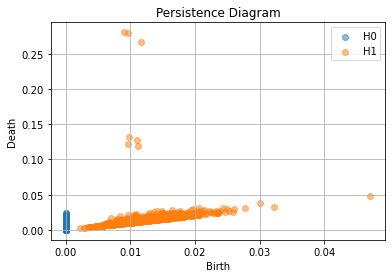

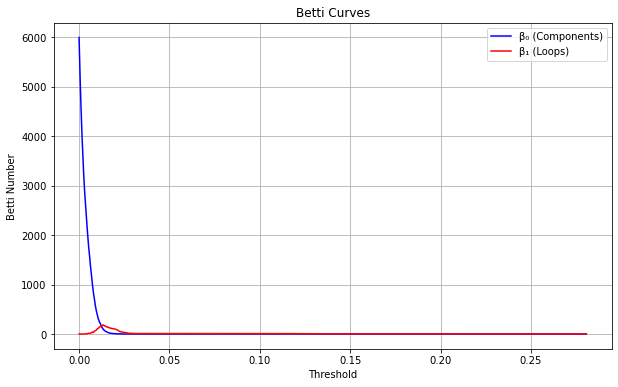

The Betti-1 value 182.0 has a range [0.0132, 0.0132]
The Betti-1 value 180.0 has a range [0.0135, 0.0135]
The Betti-1 value 171.0 has a range [0.0129, 0.0129]
The Betti-1 value 170.0 has a range [0.0138, 0.0138]
The Betti-1 value 165.0 has a range [0.0143, 0.0143]
The Betti-1 value 164.0 has a range [0.0140, 0.0140]
The Betti-1 value 160.0 has a range [0.0126, 0.0126]
The Betti-1 value 157.0 has a range [0.0121, 0.0124]
The Betti-1 value 157.0 has a range [0.0146, 0.0146]
The Betti-1 value 154.0 has a range [0.0118, 0.0118]
The Betti-1 value 149.0 has a range [0.0149, 0.0149]
The Betti-1 value 147.0 has a range [0.0152, 0.0152]
The Betti-1 value 145.0 has a range [0.0115, 0.0115]
The Betti-1 value 143.0 has a range [0.0155, 0.0155]
The Betti-1 value 139.0 has a range [0.0157, 0.0157]
The Betti-1 value 138.0 has a range [0.0112, 0.0112]
The Betti-1 value 133.0 has a range [0.0163, 0.0163]
The Betti-1 value 131.0 has a range [0.0160, 0.0160]
The Betti-1 value 128.0 has a range [0.0166, 0

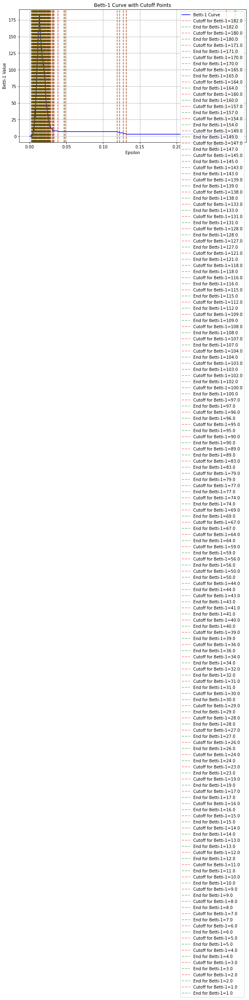

Betti-1 value 182.0 has a total range of 0.0000
Betti-1 value 180.0 has a total range of 0.0000
Betti-1 value 171.0 has a total range of 0.0000
Betti-1 value 170.0 has a total range of 0.0000
Betti-1 value 165.0 has a total range of 0.0000
Betti-1 value 164.0 has a total range of 0.0000
Betti-1 value 160.0 has a total range of 0.0000
Betti-1 value 157.0 has a total range of 0.0003
Betti-1 value 154.0 has a total range of 0.0000
Betti-1 value 149.0 has a total range of 0.0000
Betti-1 value 147.0 has a total range of 0.0000
Betti-1 value 145.0 has a total range of 0.0000
Betti-1 value 143.0 has a total range of 0.0000
Betti-1 value 139.0 has a total range of 0.0000
Betti-1 value 138.0 has a total range of 0.0000
Betti-1 value 133.0 has a total range of 0.0000
Betti-1 value 131.0 has a total range of 0.0000
Betti-1 value 128.0 has a total range of 0.0000
Betti-1 value 127.0 has a total range of 0.0000
Betti-1 value 121.0 has a total range of 0.0000
Betti-1 value 118.0 has a total range of


Adjacency Matrix:
[[0 0 0 ... 1 0 0]
 [0 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



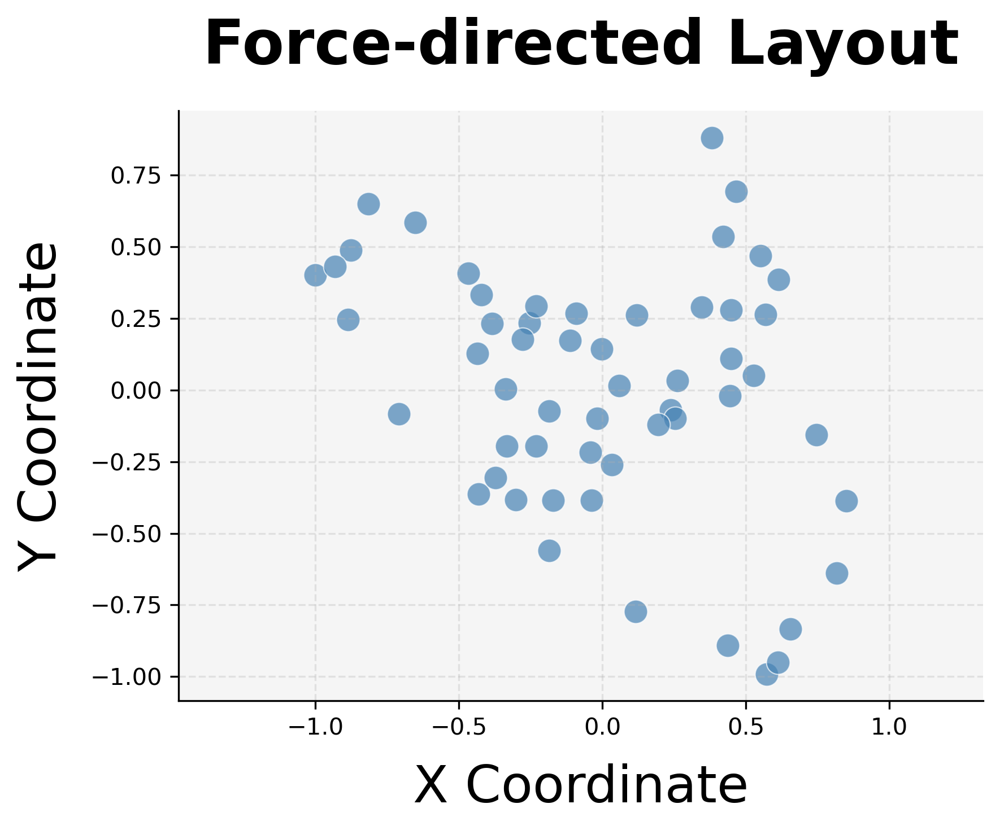

usetex mode requires TeX.


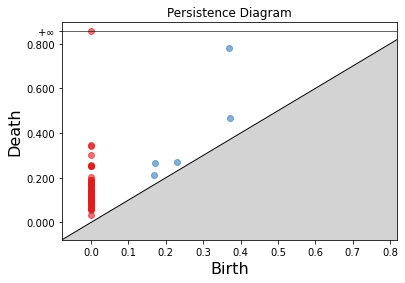

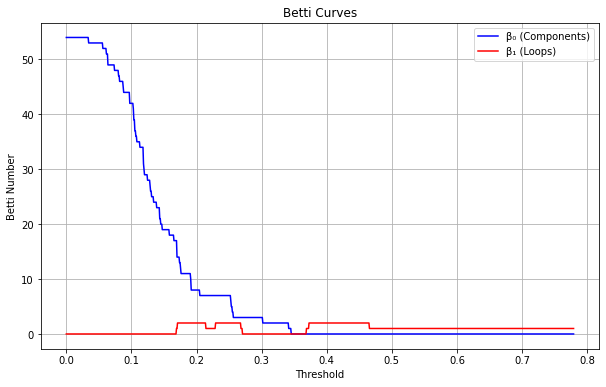

The epsilon (threshold) at which Betti-1 reaches its maximum value of 2.0 is approximately 0.1708
Betti condition is satisfied.


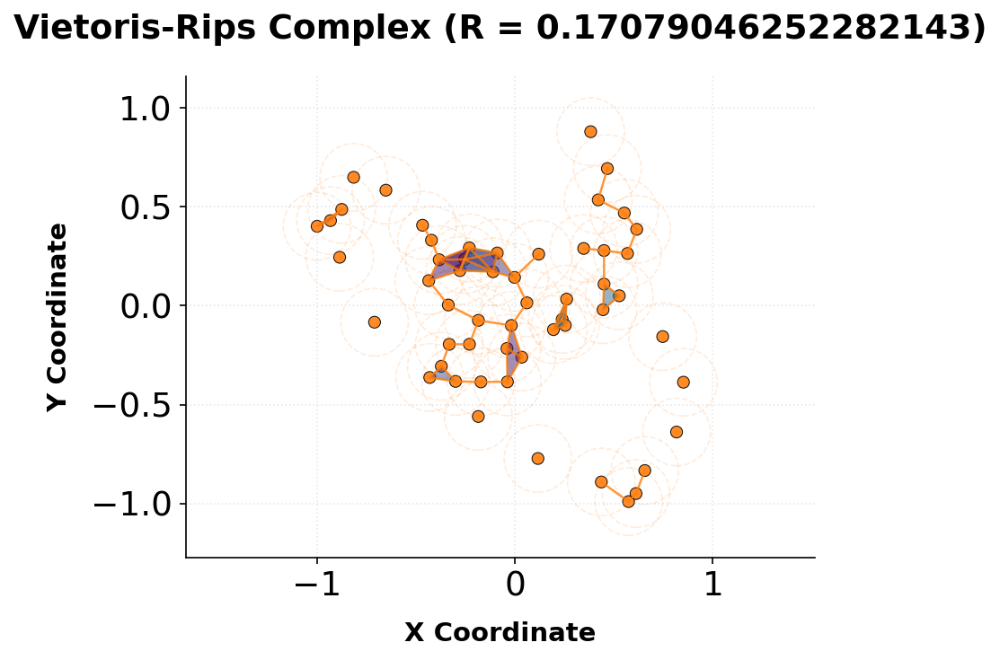

Connected Components: [array([[-0.38315467,  0.23207335],
       [-0.17218685, -0.38541542],
       [-0.04074868, -0.21650724],
       [-0.11137401,  0.1714554 ],
       [-0.01847141, -0.10001508],
       [-0.43083582, -0.36310514],
       [-0.0898242 ,  0.26615602],
       [-0.25460424,  0.23376134],
       [-0.23082992,  0.29255531],
       [-0.00235892,  0.14292543],
       [-0.46713154,  0.4065626 ],
       [-0.03833843, -0.38506431],
       [ 0.03419107, -0.26034554],
       [-0.4220963 ,  0.33090059],
       [-0.27858854,  0.17720633],
       [-0.30038843, -0.38274912],
       [ 0.11963834,  0.26052753],
       [-0.18506948, -0.07422941],
       [-0.33252921, -0.19543805],
       [-0.23016344, -0.19518549],
       [-0.33713662,  0.00323644],
       [-0.37221165, -0.30645817],
       [ 0.05993233,  0.01429387],
       [-0.43591132,  0.12628004]]), array([[-0.7098152 , -0.08357828]]), array([[-0.87551744,  0.48662464],
       [-1.        ,  0.40139468],
       [-0.93217839,  0.4300


Adjacency Matrix:
[[0 0 0 ... 1 0 0]
 [0 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



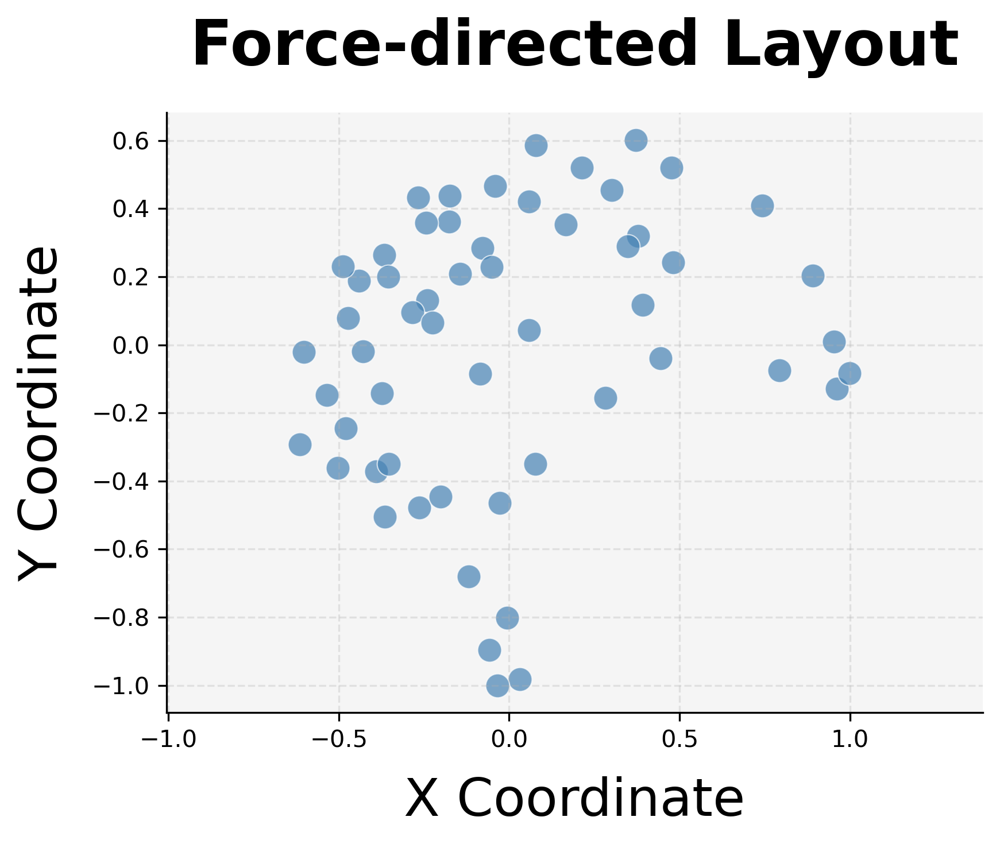

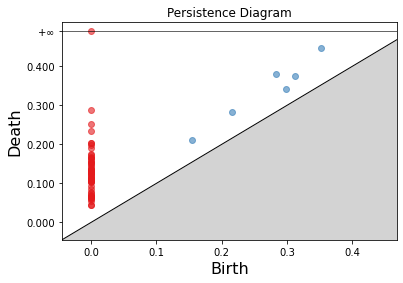

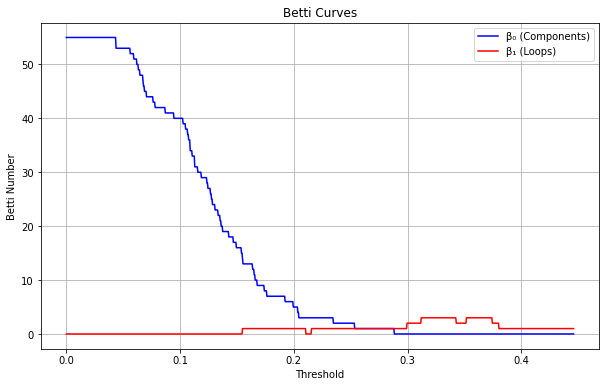

The epsilon (threshold) at which Betti-1 reaches its maximum value of 3.0 is approximately 0.3120
Betti condition is satisfied.


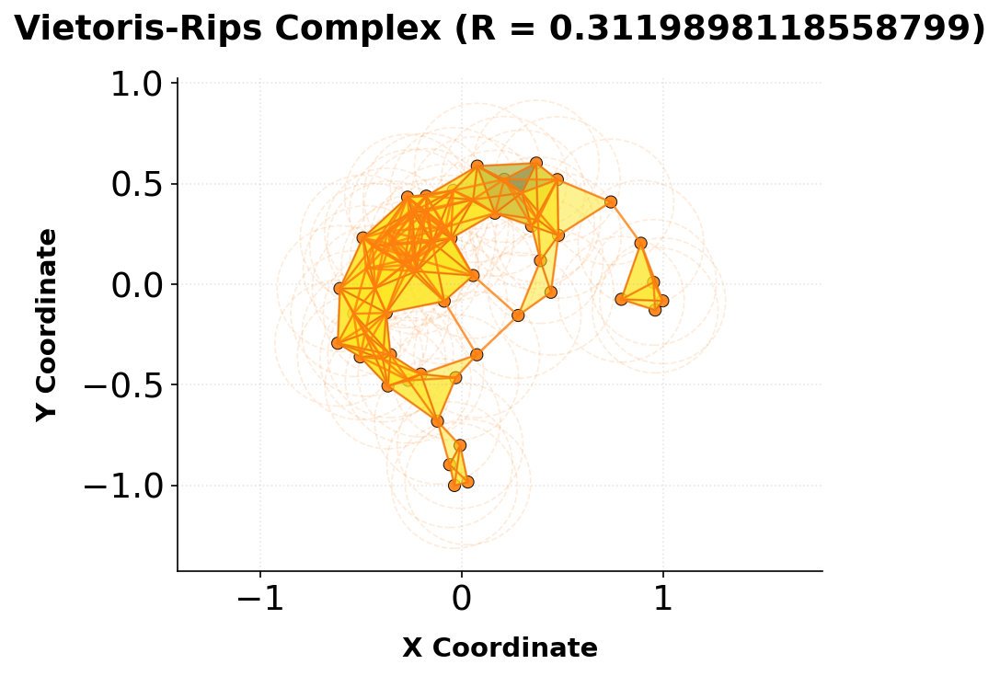

Connected Components: [array([[ 0.21265304,  0.52100043],
       [-0.2403365 ,  0.13046744],
       [-0.36716843,  0.26403053],
       [ 0.44444049, -0.03998731],
       [ 0.95389078,  0.00928725],
       [-0.0788518 ,  0.28421643],
       [-0.35504015,  0.20054385],
       [-0.47347431,  0.07813479],
       [-0.08576002, -0.08410431],
       [ 0.79409693, -0.0749854 ],
       [-0.44087218,  0.18892963],
       [ 0.05789613,  0.04321131],
       [-0.05222069,  0.22823216],
       [ 0.30066818,  0.4540169 ],
       [ 0.89085376,  0.20351432],
       [ 0.74204502,  0.40865352],
       [ 0.16606608,  0.3528577 ],
       [ 0.96189951, -0.12839805],
       [-0.28431607,  0.09566519],
       [ 0.47630924,  0.51965777],
       [-0.48878521,  0.23005131],
       [-0.22451062,  0.06462535],
       [ 0.37149675,  0.60166428],
       [-0.42864386, -0.01937107],
       [ 0.99928631, -0.08268238],
       [ 0.05776017,  0.42036925],
       [-0.14480298,  0.20880995],
       [-0.37377251, -0.14262267


Adjacency Matrix:
[[0 1 0 ... 0 0 0]
 [1 0 0 ... 1 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 1 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



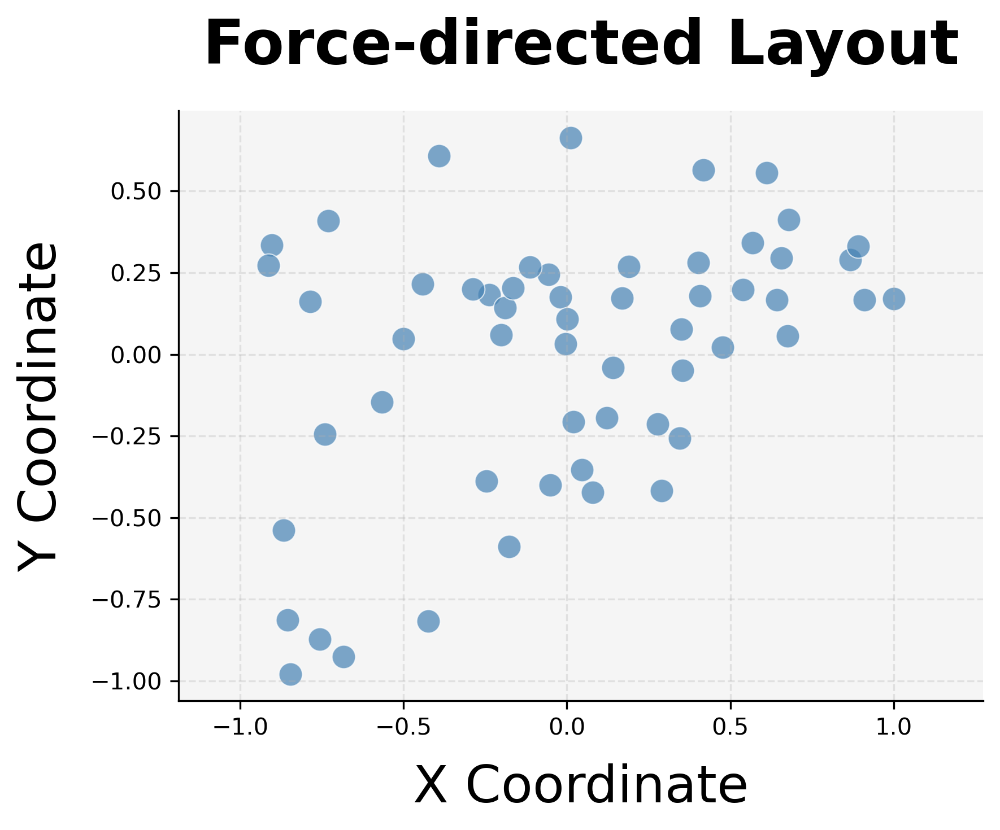

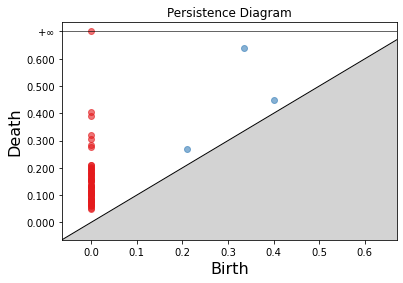

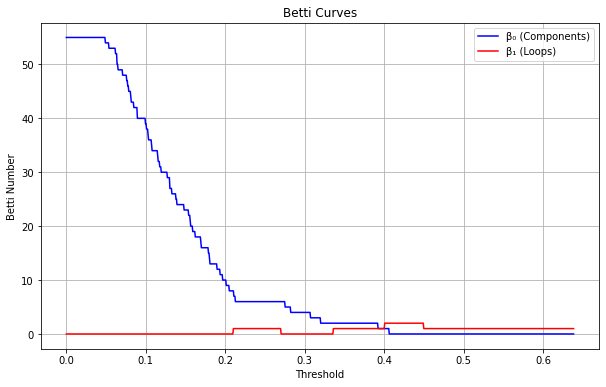

The epsilon (threshold) at which Betti-1 reaches its maximum value of 2.0 is approximately 0.4006
Betti condition is satisfied.


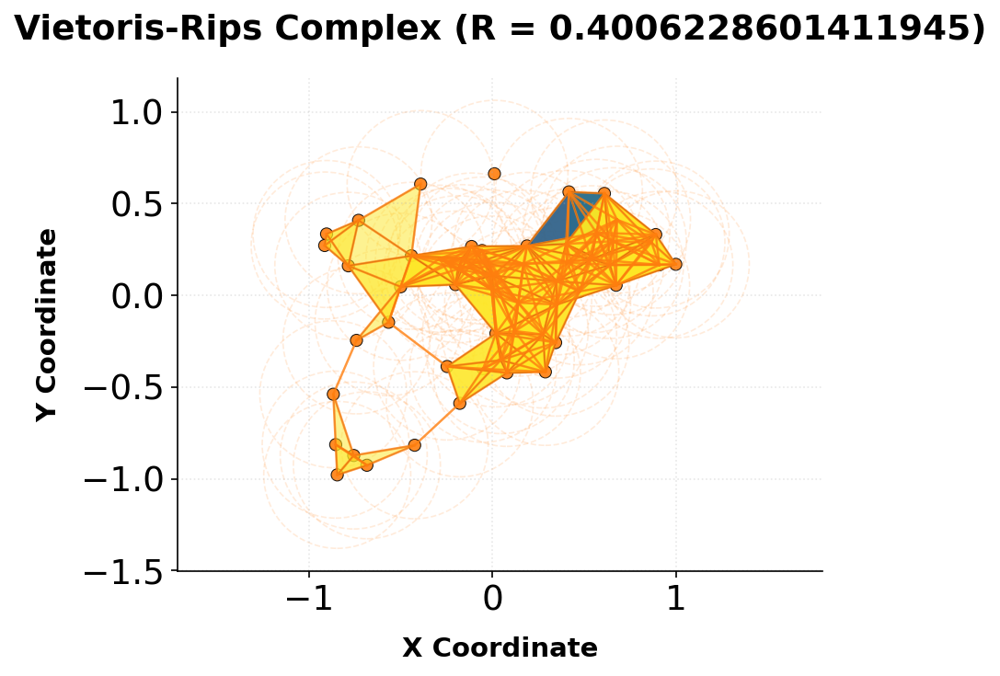

Connected Components: [array([[ 4.17776266e-01,  5.64281970e-01],
       [ 5.67770016e-01,  3.41184150e-01],
       [-5.03273275e-02, -4.00085164e-01],
       [ 1.22274564e-01, -1.94532404e-01],
       [-5.65479745e-01, -1.46523004e-01],
       [-7.28947159e-01,  4.09363389e-01],
       [ 4.07993725e-01,  1.78257385e-01],
       [ 1.69173361e-01,  1.72249619e-01],
       [ 1.41019903e-01, -3.98238622e-02],
       [-3.82565502e-03,  3.21326357e-02],
       [-1.77257712e-01, -5.88445250e-01],
       [-9.03354843e-01,  3.34786603e-01],
       [-7.84655345e-01,  1.61301060e-01],
       [ 1.97042849e-02, -2.07323543e-01],
       [-2.46330226e-01, -3.87723759e-01],
       [ 6.57226618e-01,  2.95394669e-01],
       [ 4.01787541e-01,  2.80385716e-01],
       [ 6.79536603e-01,  4.12741682e-01],
       [-3.90582446e-01,  6.07039078e-01],
       [ 4.60142999e-02, -3.52992878e-01],
       [ 1.89099058e-01,  2.69584355e-01],
       [ 6.11050359e-01,  5.55761757e-01],
       [-1.88873190e-02,  1.754


Adjacency Matrix:
[[0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



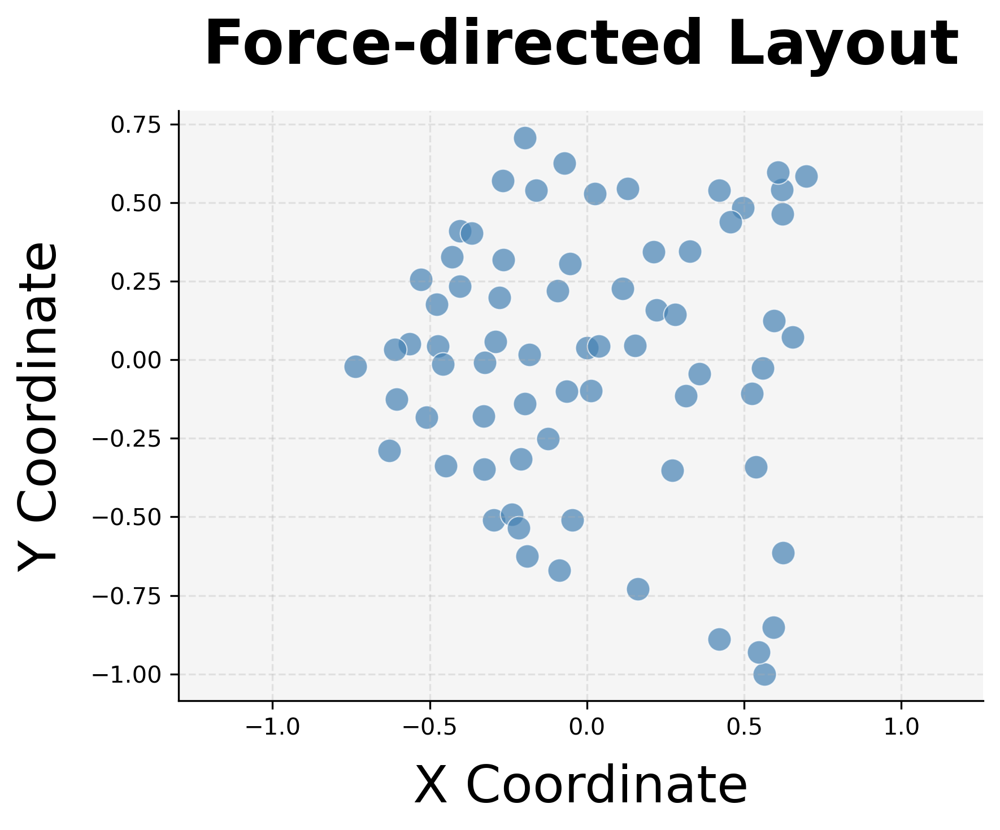

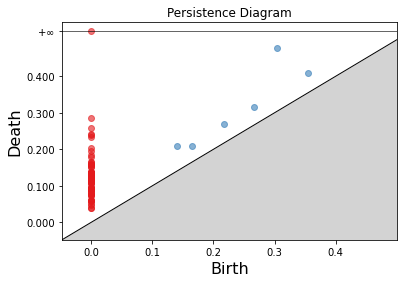

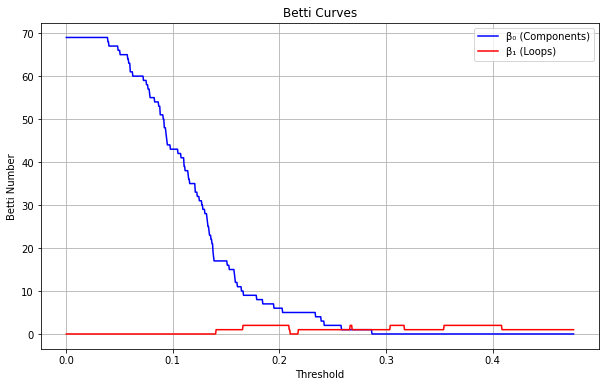

The epsilon (threshold) at which Betti-1 reaches its maximum value of 2.0 is approximately 0.1658
Betti condition is satisfied.


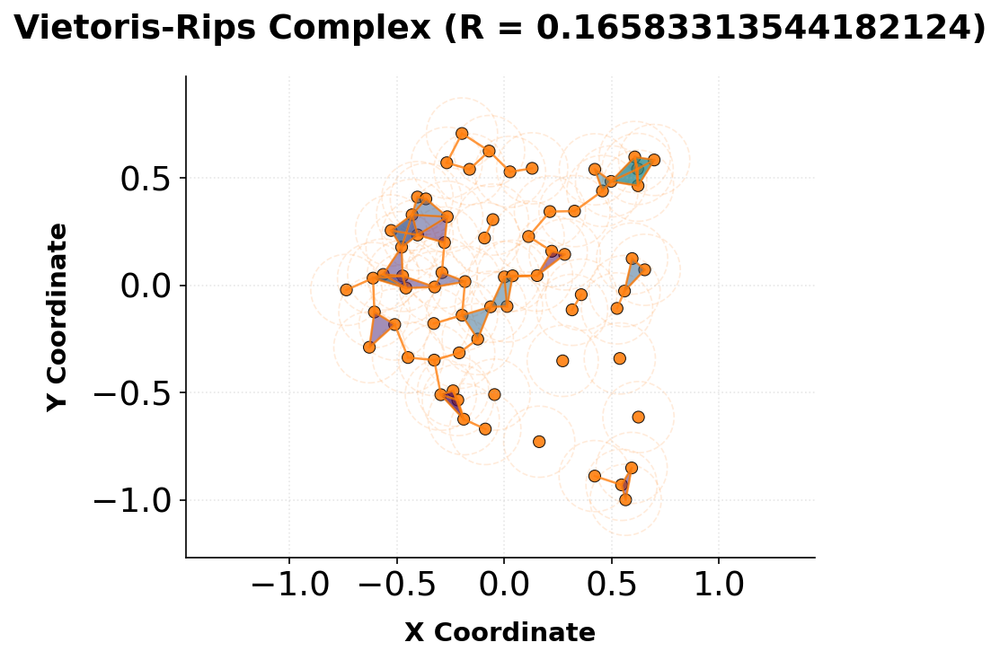

Connected Components: [array([[ 2.20633665e-01,  1.58350918e-01],
       [-2.95900568e-01, -5.10271012e-01],
       [-4.48660709e-01, -3.36970493e-01],
       [-2.78795278e-01,  1.98561397e-01],
       [-5.10641589e-01, -1.83308591e-01],
       [-4.74011474e-01,  4.32775285e-02],
       [-1.89302649e-01, -6.24601081e-01],
       [-2.38896509e-01, -4.92071544e-01],
       [ 1.12829939e-01,  2.26907324e-01],
       [ 2.12170688e-01,  3.43143806e-01],
       [ 3.26806538e-01,  3.45210961e-01],
       [ 2.81097184e-01,  1.43470016e-01],
       [-8.86494153e-02, -6.70225791e-01],
       [-2.90811667e-01,  5.87416660e-02],
       [-4.04280662e-01,  2.33929924e-01],
       [ 1.52454537e-01,  4.48032365e-02],
       [-2.65860394e-01,  3.18900975e-01],
       [-6.28705676e-01, -2.89186198e-01],
       [-6.05336397e-01, -1.25052466e-01],
       [-3.26575542e-01, -3.49022278e-01],
       [-4.29834305e-01,  3.28030385e-01],
       [-5.27576861e-01,  2.55096139e-01],
       [-4.04693769e-01,  4.108


Adjacency Matrix:
[[0 1 0 ... 0 0 0]
 [1 0 0 ... 0 1 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 1 0 ... 0 0 1]
 [0 0 0 ... 0 1 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



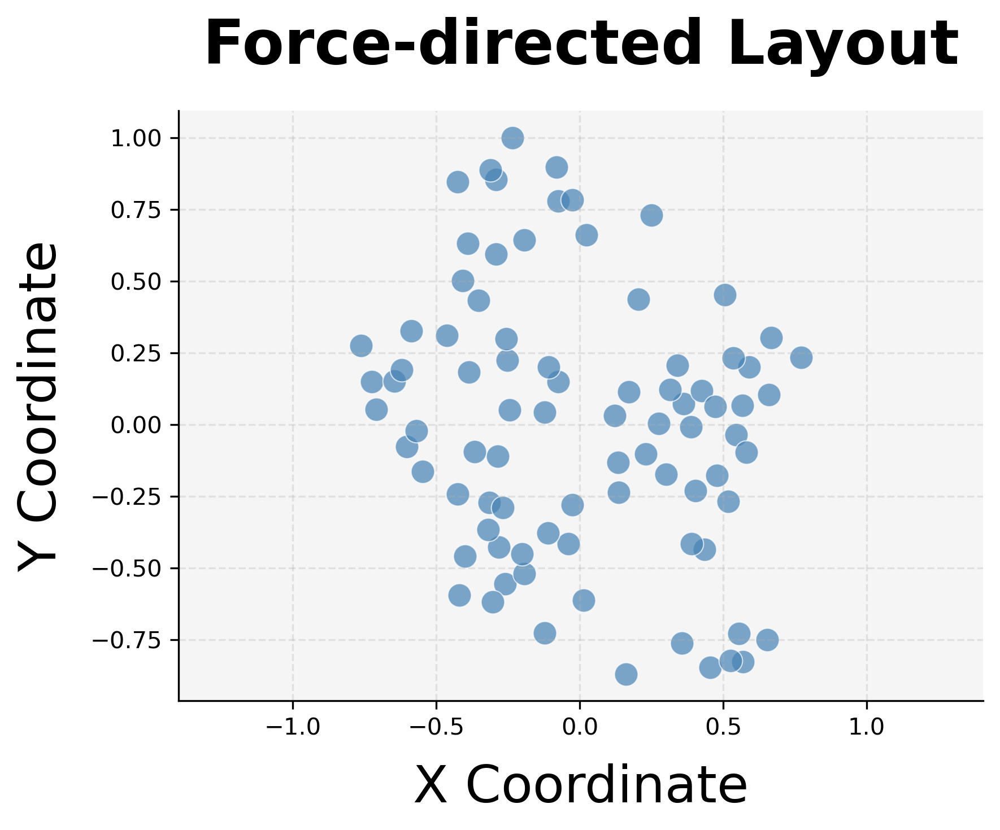

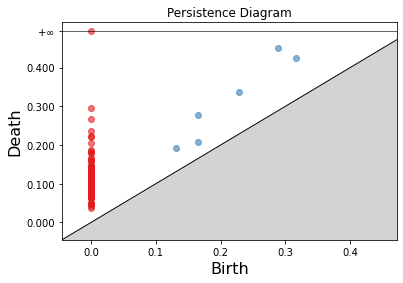

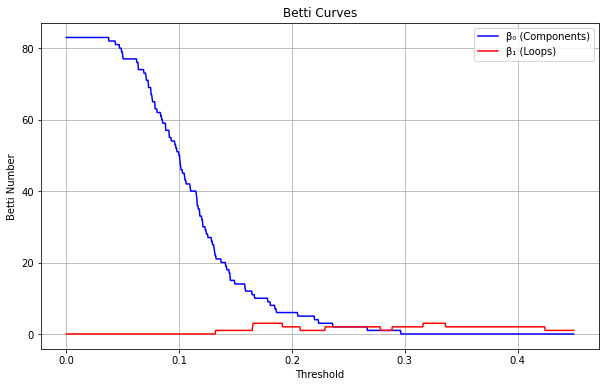

The epsilon (threshold) at which Betti-1 reaches its maximum value of 3.0 is approximately 0.1656
Betti condition is satisfied.


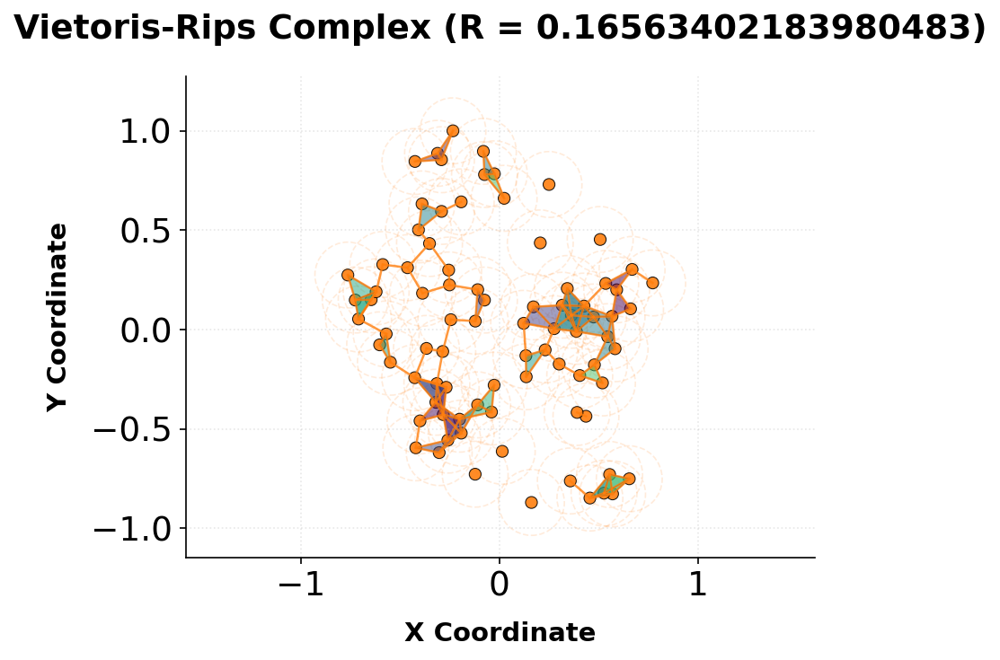

Connected Components: [array([[ 0.58962532,  0.20001992],
       [ 0.65937003,  0.10441014],
       [ 0.12187161,  0.03147889],
       [ 0.1708245 ,  0.11434734],
       [ 0.36195842,  0.07182288],
       [ 0.56628907,  0.06677717],
       [ 0.54450071, -0.03576898],
       [ 0.6670576 ,  0.30261302],
       [ 0.77074922,  0.23470643],
       [ 0.42532178,  0.11809401],
       [ 0.47328975,  0.06336187],
       [ 0.34117241,  0.2066432 ],
       [ 0.53453919,  0.23216548],
       [ 0.27529748,  0.00448232],
       [ 0.229993  , -0.10216424],
       [ 0.1329899 , -0.13141018],
       [ 0.13477668, -0.23758726],
       [ 0.38675681, -0.00899778],
       [ 0.31568625,  0.1224648 ],
       [ 0.5179857 , -0.26846573],
       [ 0.4038728 , -0.23115372],
       [ 0.30041873, -0.17368172],
       [ 0.58159946, -0.0963326 ],
       [ 0.47751162, -0.17740926]]), array([[-0.28257906, -0.42787826],
       [-0.39930227, -0.45944806],
       [-0.38676065,  0.18263543],
       [-0.31463218, -0.271604


Adjacency Matrix:
[[0 1 1 ... 0 0 0]
 [1 0 1 ... 0 0 0]
 [1 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



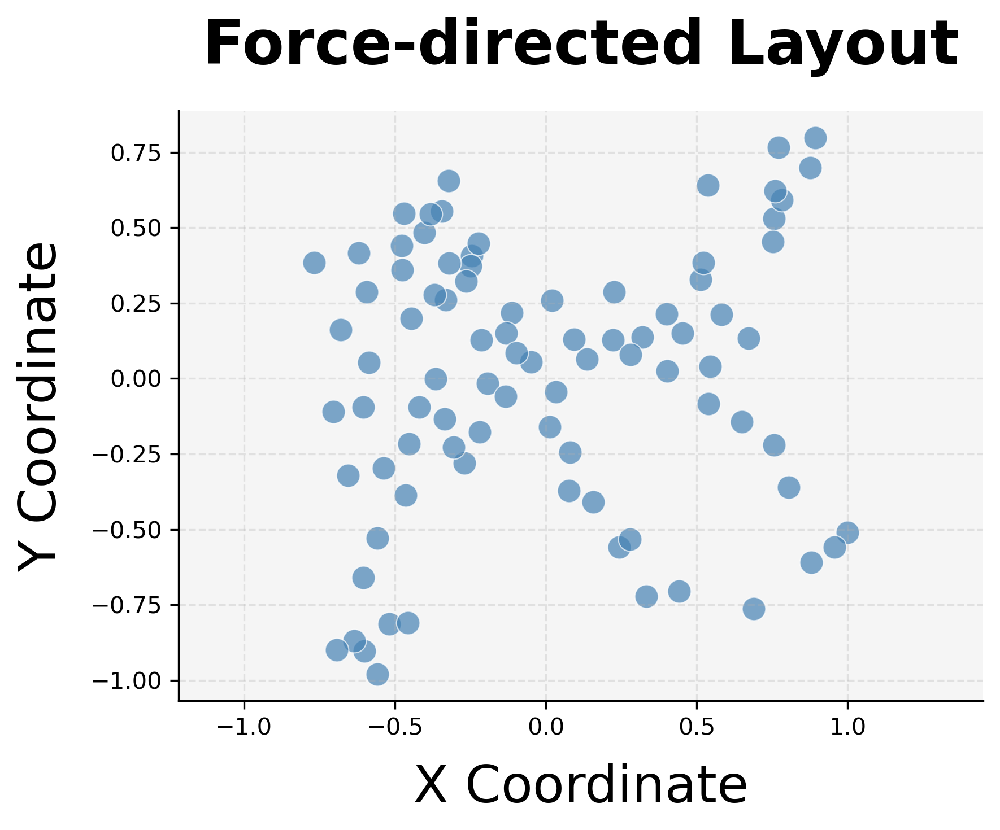

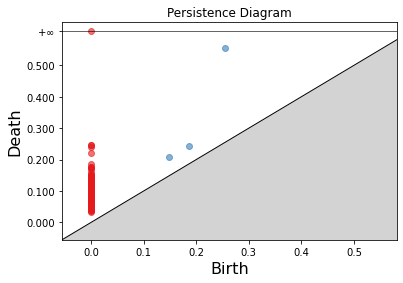

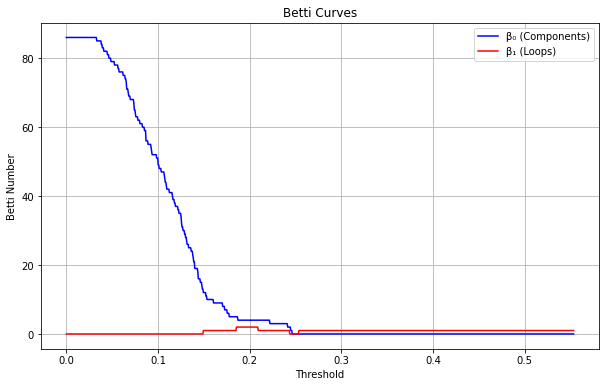

The epsilon (threshold) at which Betti-1 reaches its maximum value of 2.0 is approximately 0.1856
Betti condition is satisfied.


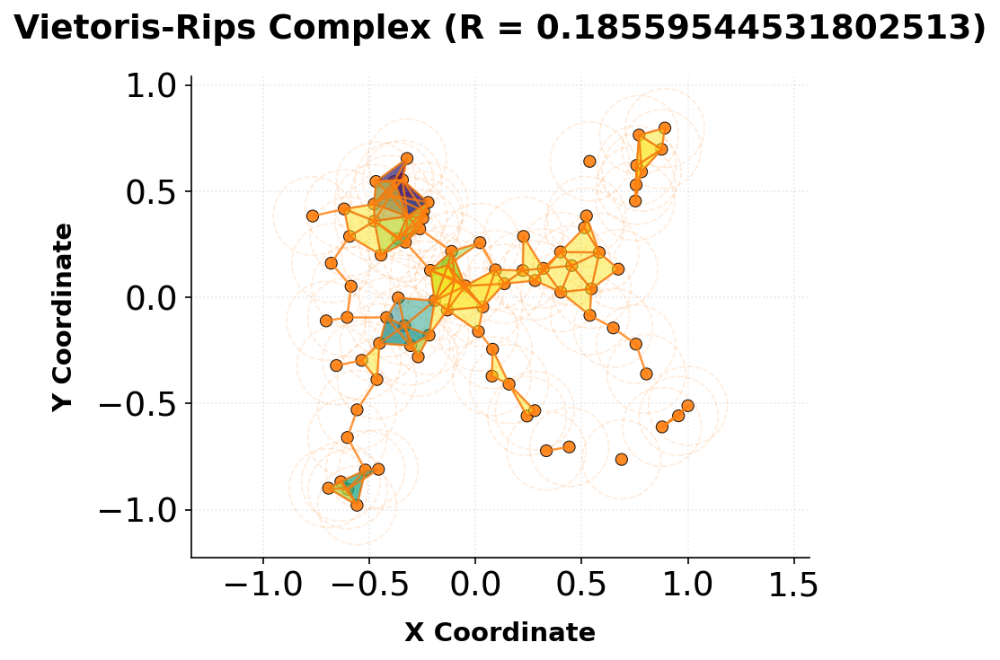

Connected Components: [array([[-0.3443084 ,  0.55415498],
       [-0.32262483,  0.65498215],
       [-0.40226488,  0.48313289],
       [-0.24444372,  0.40642957],
       [-0.41923747, -0.09441307],
       [-0.33477153, -0.13304257],
       [-0.51885365, -0.81303259],
       [-0.55795386, -0.52943999],
       [-0.60147258, -0.9037223 ],
       [-0.33047885,  0.26061398],
       [-0.24797191,  0.37339603],
       [-0.11280975,  0.21702664],
       [ 0.02092161,  0.25825545],
       [-0.21241475,  0.12788753],
       [-0.04867877,  0.05420495],
       [-0.46441628, -0.38686194],
       [-0.53633716, -0.29638724],
       [-0.26987314, -0.27989058],
       [-0.30586143, -0.22700477],
       [-0.36410014, -0.00175401],
       [-0.1923734 , -0.01507722],
       [-0.32064803,  0.38224584],
       [-0.2631195 ,  0.32350392],
       [-0.60359072, -0.65976589],
       [-0.45226775, -0.21619797],
       [-0.36775791,  0.27741135],
       [-0.13056398,  0.15136037],
       [-0.45708233, -0.80971199


Adjacency Matrix:
[[0 0 0 ... 0 0 0]
 [0 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



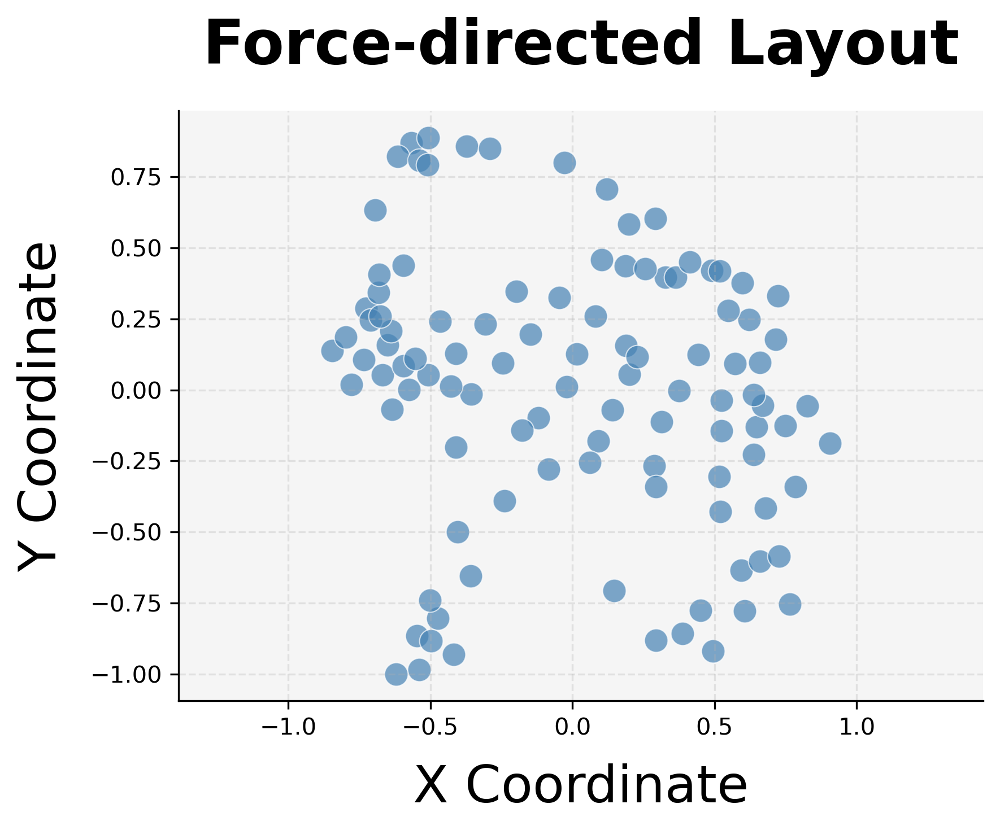

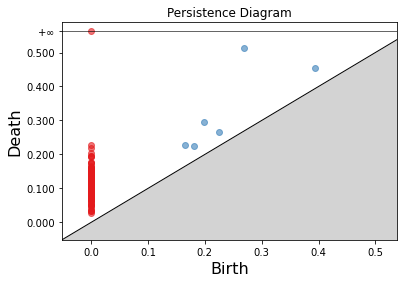

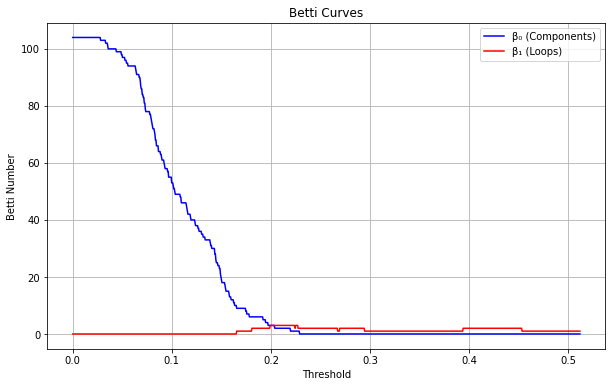

The epsilon (threshold) at which Betti-1 reaches its maximum value of 3.0 is approximately 0.1993
Betti condition is satisfied.


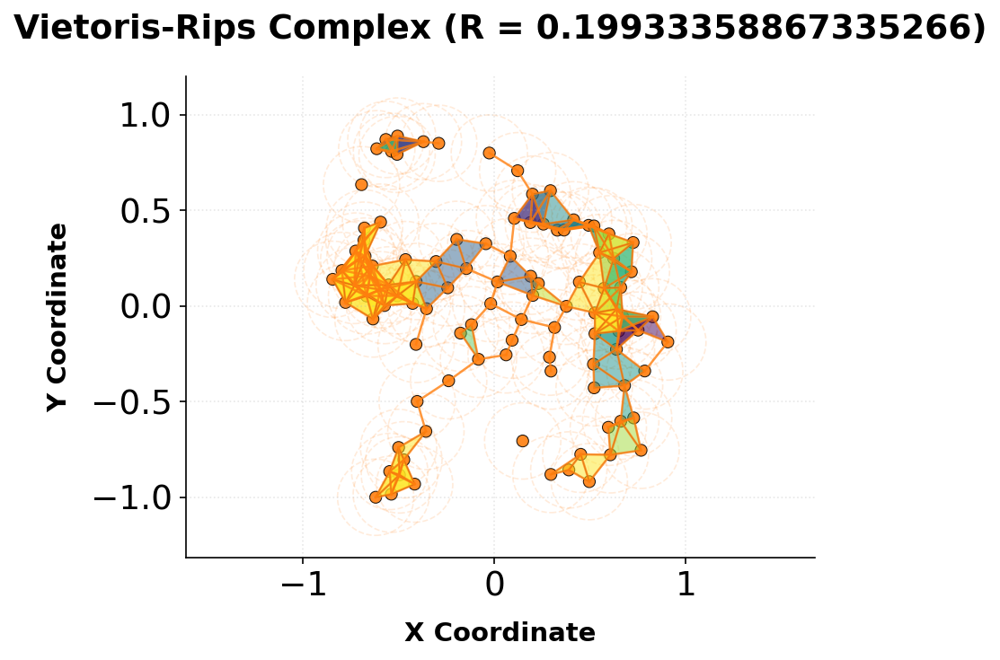

Connected Components: [array([[ 0.74974657, -0.12660634],
       [ 0.18714722,  0.43581585],
       [ 0.10352323,  0.45769391],
       [-0.02722477,  0.79924805],
       [ 0.09174243, -0.17911447],
       [ 0.06034971, -0.25583012],
       [ 0.01556657,  0.12560455],
       [-0.01997643,  0.01193901],
       [-0.14735743,  0.19528921],
       [-0.24472796,  0.09469382],
       [ 0.32792602,  0.39597924],
       [ 0.36285065,  0.39644948],
       [ 0.18881511,  0.15534958],
       [ 0.25516976,  0.42748092],
       [ 0.08195328,  0.2598004 ],
       [-0.04561436,  0.32518229],
       [ 0.51679672, -0.30456219],
       [ 0.52030379, -0.42813388],
       [ 0.28694257, -0.26784012],
       [ 0.29475894, -0.34057802],
       [ 0.78463653, -0.34005388],
       [ 0.63693547, -0.22671238],
       [ 0.67924574, -0.41614129],
       [ 0.12077061,  0.70689467],
       [ 0.49147476,  0.42141131],
       [ 0.71473915,  0.1786632 ],
       [ 0.82586183, -0.05667163],
       [ 0.29205312,  0.60262423


Adjacency Matrix:
[[0 1 0 ... 0 0 0]
 [1 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



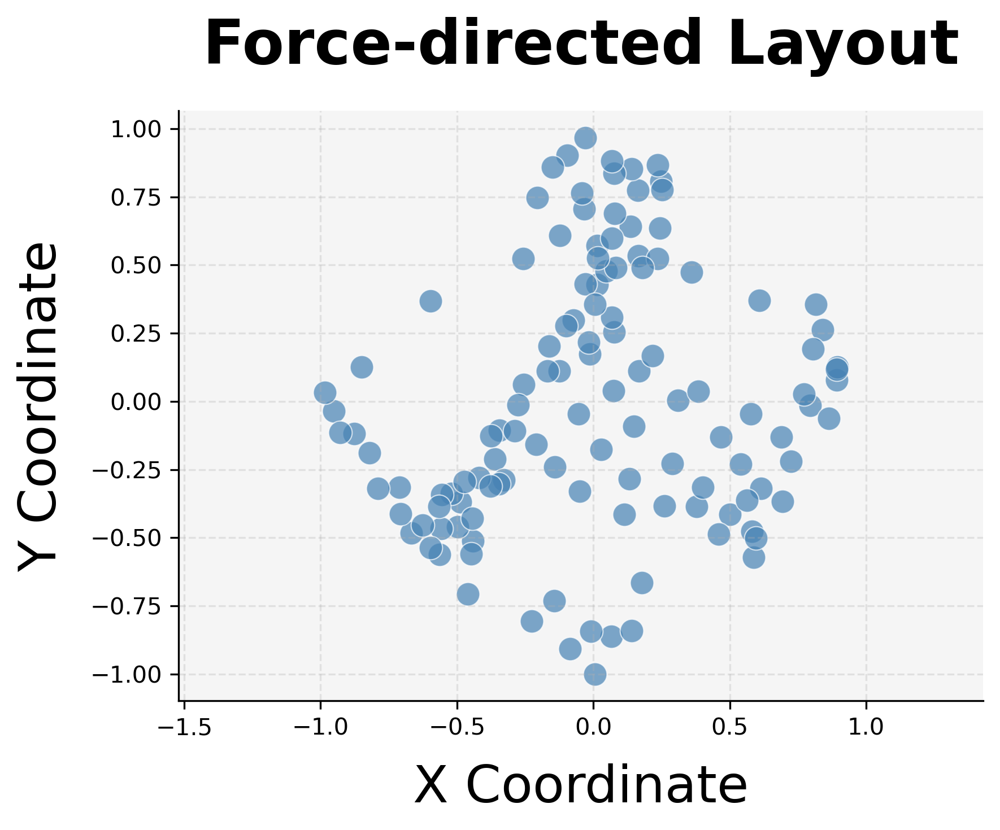

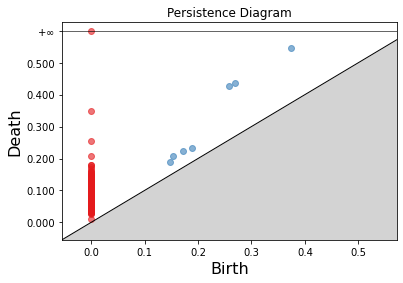

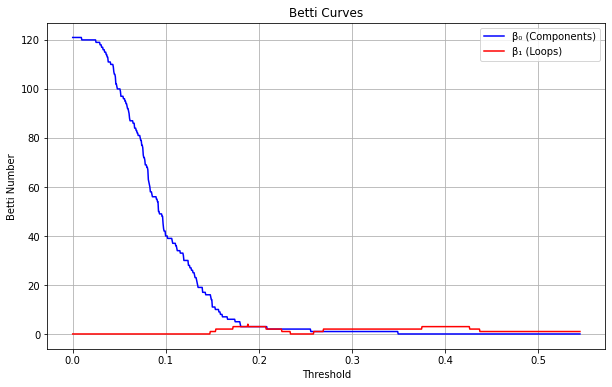

The epsilon (threshold) at which Betti-1 reaches its maximum value of 4.0 is approximately 0.1880
Betti condition is satisfied.


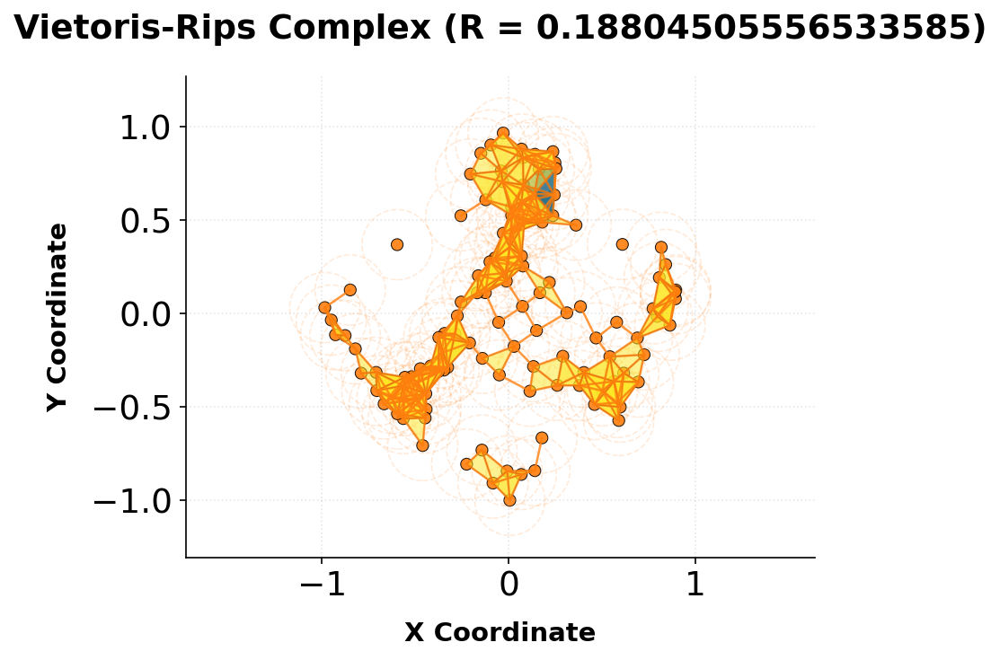

Connected Components: [array([[ 0.16517767,  0.53357725],
       [ 0.24337345,  0.63595108],
       [-0.48714393, -0.3688509 ],
       [-0.3602642 , -0.21136874],
       [-0.52111394, -0.33801963],
       [-0.32722488, -0.28759712],
       [-0.7100226 , -0.31497967],
       [-0.66768131, -0.48356933],
       [-0.95039871, -0.034602  ],
       [-0.84890743,  0.12674004],
       [-0.87634978, -0.11751061],
       [-0.98516636,  0.03221454],
       [-0.01297054,  0.17370472],
       [ 0.075525  ,  0.25490768],
       [ 0.07334313,  0.03860998],
       [ 0.16645664,  0.11171827],
       [ 0.0279655 , -0.17578319],
       [-0.44267606, -0.51216455],
       [-0.49729564, -0.45916326],
       [-0.5648667 , -0.56239978],
       [-0.55784396, -0.46578228],
       [-0.1415497 , -0.23958234],
       [ 0.01378598,  0.42793895],
       [ 0.04802951,  0.4781253 ],
       [ 0.06794998,  0.3083361 ],
       [ 0.13672346,  0.6420619 ],
       [ 0.16213732,  0.77343738],
       [-0.25649096,  0.52429605


Adjacency Matrix:
[[0 1 1 ... 0 0 0]
 [1 0 1 ... 0 0 0]
 [1 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



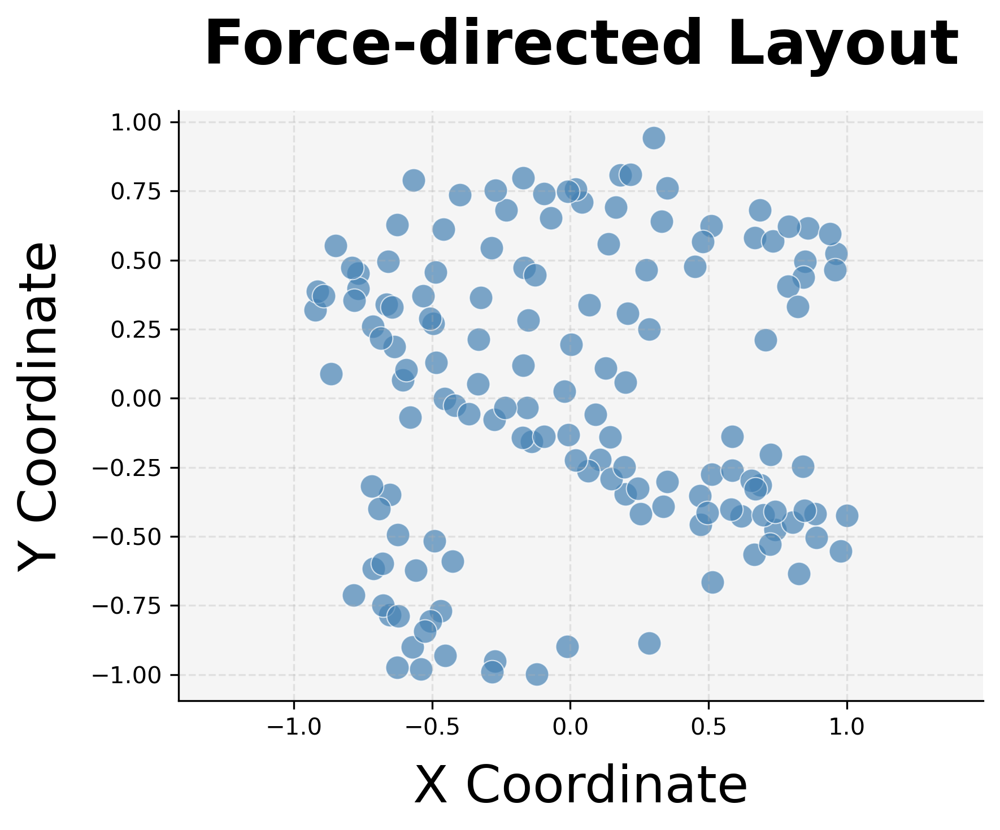

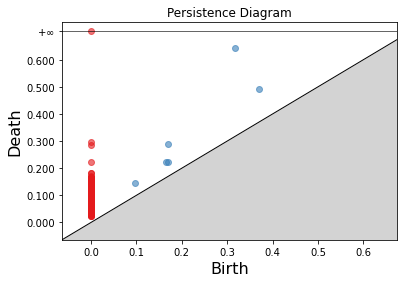

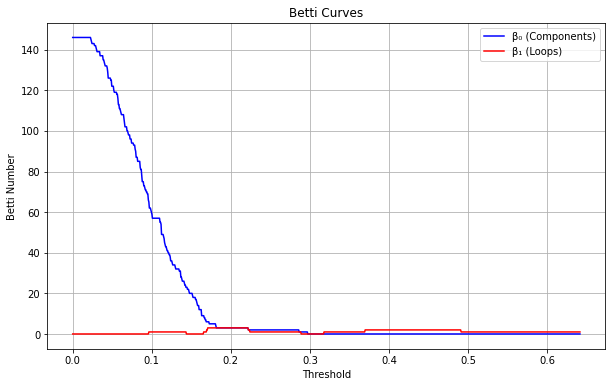

The epsilon (threshold) at which Betti-1 reaches its maximum value of 3.0 is approximately 0.1708
Betti condition is satisfied.


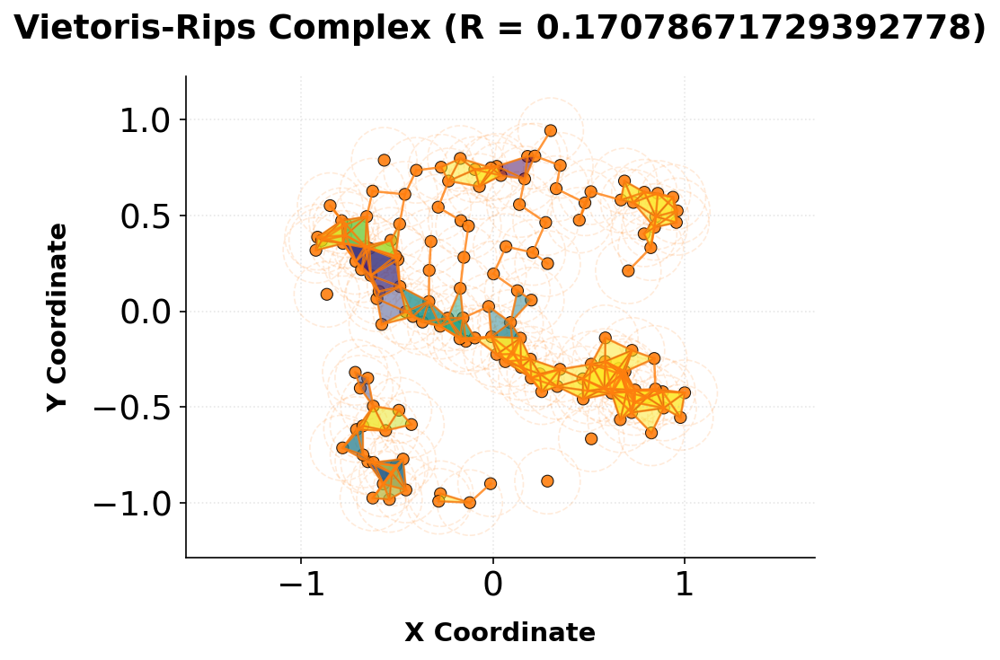

Connected Components: [array([[ 0.18088145,  0.80848105],
       [ 0.35142833,  0.76146547],
       [ 0.16572596,  0.6908636 ],
       [ 0.33006868,  0.64005759],
       [-0.71458556,  0.26057787],
       [-0.63639582,  0.187448  ],
       [-0.68523071,  0.21798898],
       [-0.604748  ,  0.06600101],
       [ 0.00334166,  0.19507944],
       [ 0.12807328,  0.10803369],
       [-0.02212039,  0.02528104],
       [ 0.09180034, -0.05835758],
       [-0.33357991,  0.05123843],
       [-0.15553691, -0.0340663 ],
       [-0.27433763, -0.07726167],
       [-0.14023526, -0.15630397],
       [-0.76615079,  0.45314207],
       [-0.76754763,  0.39644967],
       [-0.53192059,  0.37068425],
       [-0.66523852,  0.3389378 ],
       [-0.48451936,  0.12949591],
       [-0.45411389, -0.00184321],
       [-0.92287012,  0.31870069],
       [ 0.20768323,  0.30719885],
       [ 0.28539196,  0.24927846],
       [ 0.20039054,  0.05876049],
       [ 0.13838475,  0.55737664],
       [ 0.27558886,  0.46369851


Adjacency Matrix:
[[0 1 1 ... 0 0 0]
 [1 0 1 ... 0 0 0]
 [1 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



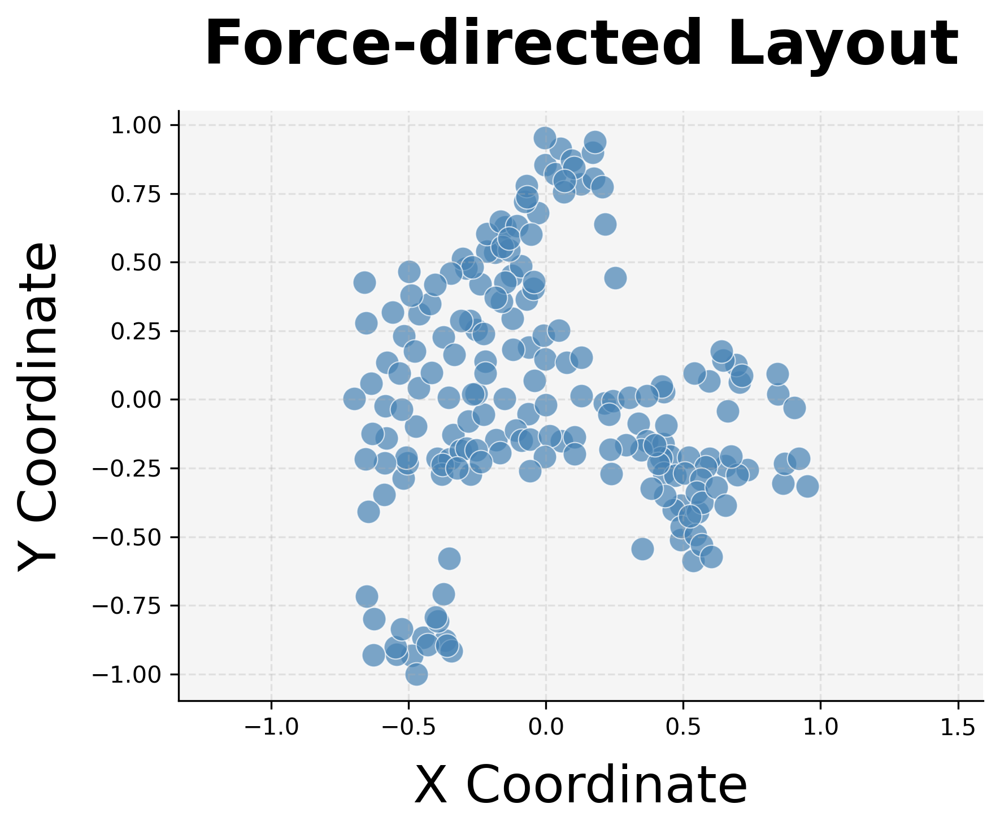

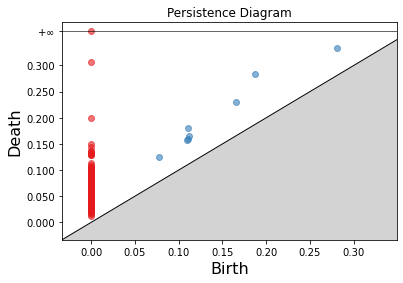

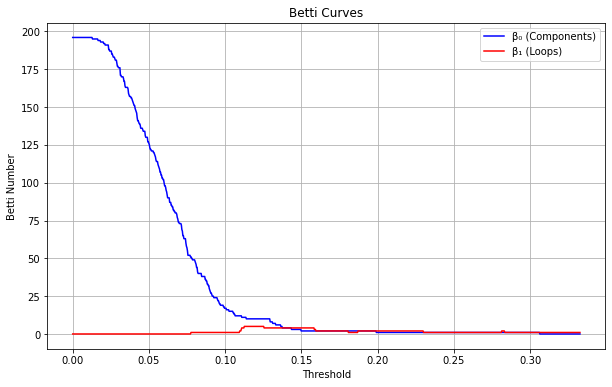

The epsilon (threshold) at which Betti-1 reaches its maximum value of 5.0 is approximately 0.1125
Betti condition is not satisfied.
For alpha = 60%, N = 16



Adjacency Matrix:
[[0 1 1 ... 0 0 0]
 [1 0 1 ... 0 0 0]
 [1 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


C:\Users\nasee\AppData\Local\Temp\ipykernel_18204\62761405.py:452: MatplotlibDeprecationWarning:

savefig() got unexpected keyword argument "quality" which is no longer supported as of 3.3 and will become an error in 3.6



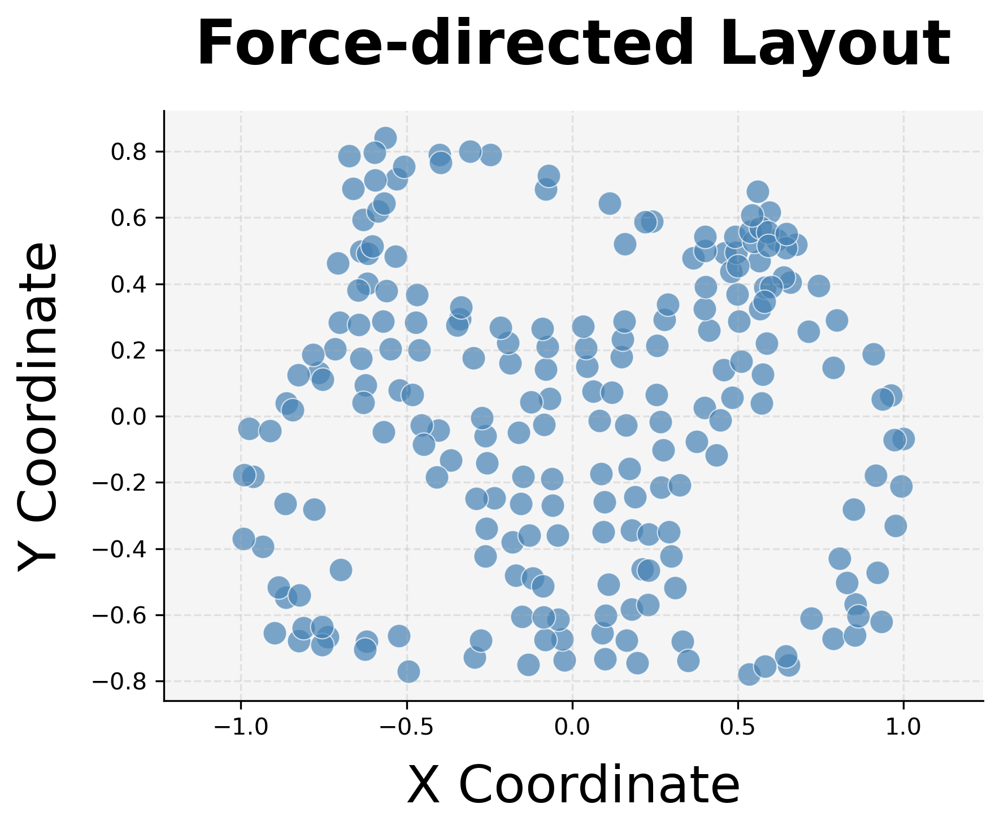

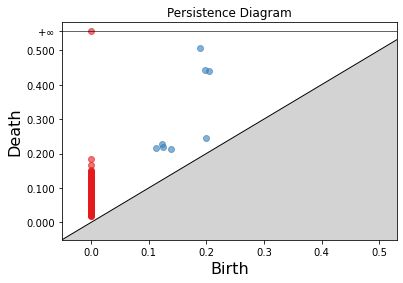

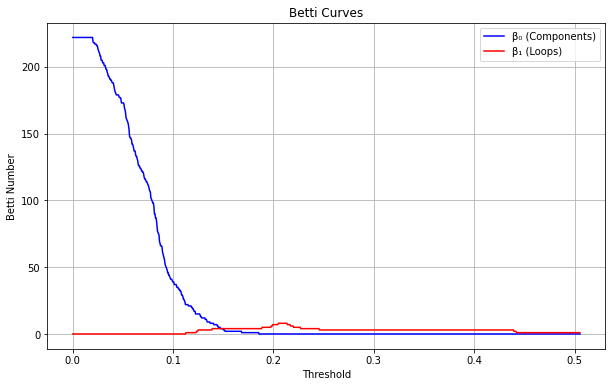

The epsilon (threshold) at which Betti-1 reaches its maximum value of 8.0 is approximately 0.2049
Betti condition is not satisfied.

Results DataFrame:
   %overlap  N value  Betti_1_1  Betti_1_2  epsilon_1  epsilon_2
0        10        8        3.0        2.0   0.135546   0.170790
1        15        8        3.0        3.0   0.135546   0.311990
2        20        8        3.0        2.0   0.135546   0.400623
3        25        9        3.0        2.0   0.135546   0.165833
4        30       10        3.0        3.0   0.135546   0.165634
5        35       10        3.0        2.0   0.135546   0.185595
6        40       11        3.0        3.0   0.135546   0.199334
7        45       12        3.0        4.0   0.135546   0.188045
8        50       13        3.0        3.0   0.135546   0.170787


In [3]:
xyz_points = xy_points_normalized
k = 0.8  # Example value for k
cutoff_betti = 1 # Example cutoff Betti value
results_df_torus = process_structural_data(xyz_points, k, cutoff_betti)

## Step 4 : We can only run for the most persistent betti 1 algorithm by  calling the function most_persistent_structural() with the dependency as the coordinate point data.

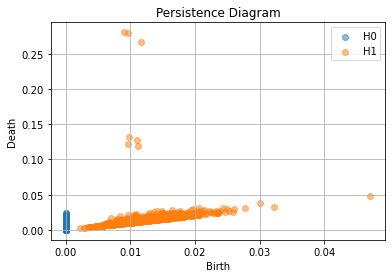

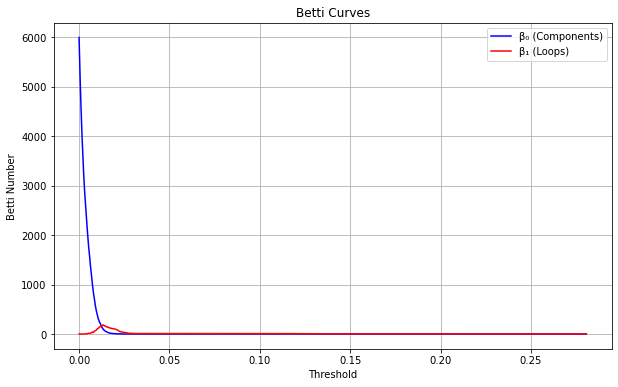

The Betti-1 value 182.0 has a range [0.0132, 0.0132]
The Betti-1 value 180.0 has a range [0.0135, 0.0135]
The Betti-1 value 171.0 has a range [0.0129, 0.0129]
The Betti-1 value 170.0 has a range [0.0138, 0.0138]
The Betti-1 value 165.0 has a range [0.0143, 0.0143]
The Betti-1 value 164.0 has a range [0.0140, 0.0140]
The Betti-1 value 160.0 has a range [0.0126, 0.0126]
The Betti-1 value 157.0 has a range [0.0121, 0.0124]
The Betti-1 value 157.0 has a range [0.0146, 0.0146]
The Betti-1 value 154.0 has a range [0.0118, 0.0118]
The Betti-1 value 149.0 has a range [0.0149, 0.0149]
The Betti-1 value 147.0 has a range [0.0152, 0.0152]
The Betti-1 value 145.0 has a range [0.0115, 0.0115]
The Betti-1 value 143.0 has a range [0.0155, 0.0155]
The Betti-1 value 139.0 has a range [0.0157, 0.0157]
The Betti-1 value 138.0 has a range [0.0112, 0.0112]
The Betti-1 value 133.0 has a range [0.0163, 0.0163]
The Betti-1 value 131.0 has a range [0.0160, 0.0160]
The Betti-1 value 128.0 has a range [0.0166, 0

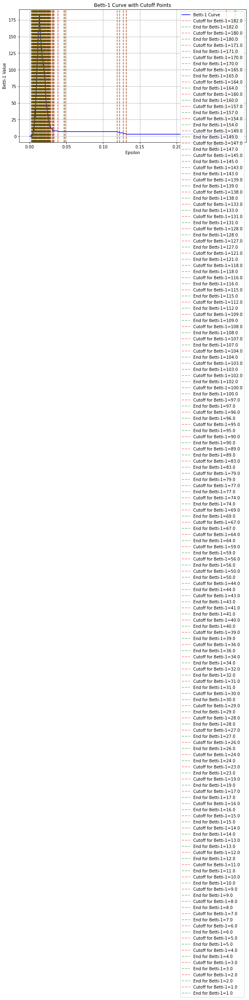

Betti-1 value 182.0 has a total range of 0.0000
Betti-1 value 180.0 has a total range of 0.0000
Betti-1 value 171.0 has a total range of 0.0000
Betti-1 value 170.0 has a total range of 0.0000
Betti-1 value 165.0 has a total range of 0.0000
Betti-1 value 164.0 has a total range of 0.0000
Betti-1 value 160.0 has a total range of 0.0000
Betti-1 value 157.0 has a total range of 0.0003
Betti-1 value 154.0 has a total range of 0.0000
Betti-1 value 149.0 has a total range of 0.0000
Betti-1 value 147.0 has a total range of 0.0000
Betti-1 value 145.0 has a total range of 0.0000
Betti-1 value 143.0 has a total range of 0.0000
Betti-1 value 139.0 has a total range of 0.0000
Betti-1 value 138.0 has a total range of 0.0000
Betti-1 value 133.0 has a total range of 0.0000
Betti-1 value 131.0 has a total range of 0.0000
Betti-1 value 128.0 has a total range of 0.0000
Betti-1 value 127.0 has a total range of 0.0000
Betti-1 value 121.0 has a total range of 0.0000
Betti-1 value 118.0 has a total range of

In [5]:
most_persistenet_structural(xyz_points)